In [1]:
!pip install --upgrade protobuf==3.20.3 --no-cache-dir
!pip install --upgrade ultralytics pandas --no-cache-dir
!pip install --upgrade roboflow --no-cache-dir


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.31.1
    Uninstalling protobuf-6.31.1:
      Successfully uninstalled protobuf-6.31.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.74.0 requires protobuf<7.0.0,>=6.31.1, but you have protobuf 3.20.3 which is incompatible.
google-colabsqlviz 0.1.3 requires protobuf<7.0.0,>=6.31.1, but you have protobuf 3.20.3 which is incompatible.
opentelemetry-proto 1.35.0 requires protobuf<7.0,>=5.0, but you have protobuf 3.20.3 which is incompatible.
ydf 0.13.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 3.20.3 which is incompatible.
tensorflow-metadata 1.17.2 requires protobuf>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 253.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 263.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 192.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 261.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 335.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 264.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 294.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 257.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 229.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 231.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
!pip install ultralytics
!pip install torch torchvision torchaudio

###Cell 1 — Master switches and paths

In [3]:
import os
# ====== A) CHOOSE DATA SOURCE ======
# False = build from original COCO (annotations.json + original images)
# True  = build from your cropped dataset (YOLO labels)
USE_CROPS = True   # <-- switch to True to use /content/taco_crops

# USE_CROPS = False → use original images with bounding boxes from annotations.json.
# USE_CROPS = True → use already-cropped patches with YOLO labels.

# ====== B) TRAIN/VAL SPLIT ======
TRAIN_FRAC = 0.80
VAL_FRAC   = 0.10
TEST_FRAC = 0.10
assert abs((TRAIN_FRAC + VAL_FRAC + TEST_FRAC) - 1.0) < 1e-6, "Splits must sum to 1.0"
RAND_SEED  = 42

# ====== C) CLASS FILTERING ======
# If you want to keep all classes: set FILTER_BY_NAMES=[], MIN_PCT=None, MAX_PCT=None
FILTER_BY_NAMES   = ["Cigarette","Plastic film","Clear plastic bottle","Other plastic",
"Other plastic wrapper","Drink can","Plastic bottle cap",
"Plastic straw","Broken glass","Styrofoam piece","Glass bottle",
"Disposable plastic cup","Pop tab","Other carton","Normal paper ",
"Metal bottle cap","Plastic lid","Paper cup","Corrugated carton",
"Aluminium foil"]        # e.g. ["Cigarette", "Drink can"]
MIN_PCT           = 1.3      # e.g. 1.0  -> drop classes < 1% of objects
MAX_PCT           = None      # e.g. 10.0 -> drop classes > 10% of objects

# ====== D) ORIGINAL COCO SOURCE (if USE_CROPS=False) ======
LOCAL_SRC = "/content/TACO_2025_08_16/taco_env/TACO/data"  # contains images and annotations.json
ANN_FILE  = os.path.join(LOCAL_SRC, "annotations.json")

# (Optional) If your original dataset is in GCS and you want to copy it down, set:
COPY_FROM_GCS = False
GCS_SRC       = "gs://taco_2025_08_16/taco_env/TACO/data"  # change if COPY_FROM_GCS=True

# ====== E) CROPS SOURCE (if USE_CROPS=True) ======
CROP_ROOT   = "/content/taco_crops"                 # images/ and labels/ are inside here
CROP_IMAGES = os.path.join(CROP_ROOT, "images")
CROP_LABELS = os.path.join(CROP_ROOT, "labels")
CROP_YAML   = os.path.join(CROP_ROOT, "taco_crops.yaml")  # should exist after cropping

# ====== F) ACTIVE YOLO DATASET OUTPUT (always rebuilt here) ======
OUT_ROOT  = "/content/taco_yolo"                    # active dataset for training
IM_OUT    = os.path.join(OUT_ROOT, "images")
LBL_OUT   = os.path.join(OUT_ROOT, "labels")
YAML_PATH = os.path.join(OUT_ROOT, "taco_data.yaml")

print("USE_CROPS:", USE_CROPS)
print("Source:", (CROP_ROOT if USE_CROPS else LOCAL_SRC))
print("Active YOLO build:", OUT_ROOT)

USE_CROPS: True
Source: /content/taco_crops
Active YOLO build: /content/taco_yolo


###Cell 1.99 — (Optional) Copy original data down from GCS (run only if COPY_FROM_GCS=True

In [4]:
# Cell 1.99 — (Optional) Copy original data down from GCS (run only if COPY_FROM_GCS=True)
if not USE_CROPS and COPY_FROM_GCS:
    # Wipe old local copy and pull again
    !rm -rf "{LOCAL_SRC}"
    !mkdir -p "{LOCAL_SRC}"
    # Faster & safer than cp -r (no wildcard issues)
    !gsutil -m rsync -r "{GCS_SRC}" "{LOCAL_SRC}"
    import os
    print("annotations.json exists?", os.path.isfile(os.path.join(LOCAL_SRC, "annotations.json")))


###Cell 2 - Image Cropping

In [5]:
# Cell 2 — Image Cropping (creates /content/taco_crops/{images,labels} + taco_crops.yaml)
# - Pre-creates LOCAL_SRC and uses trailing slashes in rsync (fixes "does not name a directory")
# - Auto-picks a valid annotations file
# - Hybrid crops: small=fixed square, large=proportional so object is ~50–80% of patch

import os, glob, json, random, shutil
import cv2
import numpy as np

# --- Expect these from Cell 1 ---
# GCS_SRC       = "gs://taco_2025_08_16/taco_env/TACO/data"
# LOCAL_SRC     = "/content/TACO_2025_08_16/taco_env/TACO/data"
# ANN_FILE      = os.path.join(LOCAL_SRC, "annotations.json")
# CROP_ROOT     = "/content/taco_crops"
# CROP_IMAGES   = os.path.join(CROP_ROOT, "images")
# CROP_LABELS   = os.path.join(CROP_ROOT, "labels")
# CROP_YAML     = os.path.join(CROP_ROOT, "taco_crops.yaml")

# -----------------------------
# 0) Ensure destination exists, then rsync (quiet)
# -----------------------------
os.makedirs(LOCAL_SRC, exist_ok=True)  # <-- FIX: create destination before rsync
# Trailing slashes tell gsutil these are directories
!gsutil -m -q rsync -r "{GCS_SRC}/" "{LOCAL_SRC}/"

# Quick check after rsync
if not os.path.isdir(LOCAL_SRC):
    raise RuntimeError(f"LOCAL_SRC not found after rsync: {LOCAL_SRC}")

# -----------------------------
# 1) Find a valid COCO annotations file under LOCAL_SRC
# -----------------------------
def _looks_like_coco(path: str) -> bool:
    """
    Purpose:
        Heuristically validate that a JSON file at `path` looks like a COCO annotations file.

    Args:
        path (str): Filesystem path to a JSON file.

    Returns:
        bool: True if the file exists, can be parsed as JSON, and contains the
              standard COCO top-level keys: "images", "annotations", "categories";
              otherwise False.
    """
    try:
        with open(path, "r") as f:
            j = json.load(f)
        return all(k in j for k in ("images", "annotations", "categories"))
    except Exception:
        return False

# Primary and fallback candidates
picked_ann = None
cand = [
    os.path.join(LOCAL_SRC, "annotations.json"),
    os.path.join(LOCAL_SRC, "annotations_unofficial.json"),
]
cand += sorted(glob.glob(os.path.join(LOCAL_SRC, "**", "annotations*.json"), recursive=True))

for p in cand:
    if os.path.isfile(p) and _looks_like_coco(p):
        picked_ann = p
        break

if not picked_ann:
    raise FileNotFoundError("No valid COCO annotations file found under LOCAL_SRC.")

ANN_FILE = picked_ann
print("Using ANN_FILE:", ANN_FILE)

# -----------------------------
# 2) Cropping hyperparameters
# -----------------------------
BORDER_FRAC = 0.10   # legacy compat; not used in proportional mode
SIZE_THRESH = 64     # px: if max(w,h) < SIZE_THRESH -> SMALL
FIXED_PAD   = 128    # px: half-size (~256×256 nominal for small objects)

OBJ_FRAC_RANGE = (0.50, 0.80)  # teacher suggestion: ~50–80% of patch area for large objects
JPEG_QUALITY   = 95
WIPE_OLD_CROPS = False

# -----------------------------
# 3) Prepare output directories
# -----------------------------
if WIPE_OLD_CROPS and os.path.isdir(CROP_ROOT):
    shutil.rmtree(CROP_ROOT)
os.makedirs(CROP_IMAGES, exist_ok=True)
os.makedirs(CROP_LABELS, exist_ok=True)

def _clip(v: int | float, lo: int | float, hi: int | float) -> int | float:
    """
    Purpose:
        Clamp a numeric value to the inclusive range [lo, hi].

    Args:
        v (int | float): The input value to clamp.
        lo (int | float): Lower bound.
        hi (int | float): Upper bound.

    Returns:
        int | float: The clamped value, same type category as inputs.
    """
    return max(lo, min(hi, v))

def _choose_target_fraction(frac_range: tuple[float, float]) -> float:
    """
    Purpose:
        Randomly choose a target object-area fraction within a range.
        Used to set the proportion of the crop occupied by the object for large objects.

    Args:
        frac_range (tuple[float, float]): (low, high) inclusive bounds, e.g. (0.50, 0.80).

    Returns:
        float: A random float in [low, high].
    """
    lo, hi = frac_range
    return random.uniform(lo, hi)

def _find_image_path(root: str, fname: str) -> str | None:
    """
    Purpose:
        Resolve an image path from COCO `file_name`, which may be a relative path
        or a simple basename. Searches `root` directly, then recursively by basename.

    Args:
        root (str): Root directory to search under (e.g., LOCAL_SRC).
        fname (str): File name field from COCO (may include subfolders).

    Returns:
        str | None: Full path to the file if found; otherwise None.
    """
    p = os.path.join(root, fname)
    if os.path.isfile(p):
        return p
    base = os.path.basename(fname)
    hits = glob.glob(os.path.join(root, "**", base), recursive=True)
    return hits[0] if hits else None

# -----------------------------
# 4) Load COCO, map classes, group annotations
# -----------------------------
with open(ANN_FILE, "r") as f:
    coco = json.load(f)

cats_sorted  = sorted(coco["categories"], key=lambda c: c["id"])
catid_to_idx = {c["id"]: i for i, c in enumerate(cats_sorted)}
names        = [c["name"] for c in cats_sorted]

img_by_id   = {im["id"]: im for im in coco["images"]}
anns_by_img = {im["id"]: [] for im in coco["images"]}
for a in coco["annotations"]:
    anns_by_img[a["image_id"]].append(a)

# -----------------------------
# 5) Hybrid crop function
# -----------------------------
def expand_bbox(x: float, y: float, w: float, h: float,
                W: int, H: int,
                border_frac: float, fixed_pad: int, size_thresh: int) -> tuple[int, int, int, int] | None:
    """
    Purpose:
        Compute a crop rectangle (x1, y1, x2, y2) around a COCO bbox using a HYBRID policy:
          - SMALL object (max(w, h) < size_thresh): fixed-size square crop centered on the bbox
            with half-size = fixed_pad (ensures bbox is fully covered).
          - LARGE object (else): proportional crop so that object_area / crop_area ≈ target_f,
            where target_f is randomly chosen in OBJ_FRAC_RANGE (e.g., 50–80%).

    Args:
        x, y, w, h (float): COCO bbox in pixels (top-left x,y and width,height).
        W, H (int): Full image width/height in pixels.
        border_frac (float): Compatibility arg (not used in proportional branch).
        fixed_pad (int): Half of the square crop size for small objects.
        size_thresh (int): Threshold (in pixels) that separates "small" from "large" objects
                           using max(w, h).

    Returns:
        tuple[int, int, int, int] | None:
            The crop rectangle coordinates (x1, y1, x2, y2), clipped to image bounds.
            Returns None if the resulting rectangle is empty or invalid.
    """
    use_fixed = (max(w, h) < size_thresh)
    cx = x + w / 2.0
    cy = y + h / 2.0

    if use_fixed:
        # Fixed square around bbox center
        half = fixed_pad
        x1 = int(round(cx - half)); y1 = int(round(cy - half))
        x2 = int(round(cx + half)); y2 = int(round(cy + half))
        # Ensure the crop fully covers the bbox in case bbox > window
        if (x2 - x1) < w:
            extra = int(((w - (x2 - x1)) + 1) // 2); x1 -= extra; x2 += extra
        if (y2 - y1) < h:
            extra = int(((h - (y2 - y1)) + 1) // 2); y1 -= extra; y2 += extra
    else:
        # Proportional crop so object occupies ~target_f of the crop area
        target_f = _choose_target_fraction(OBJ_FRAC_RANGE)
        obj_area = max(w * h, 1.0)
        crop_area = obj_area / max(target_f, 1e-6)
        aspect = w / max(h, 1e-6)
        crop_w = max((crop_area * aspect) ** 0.5, w)
        crop_h = max(crop_area / max(crop_w, 1e-6), h)
        x1 = int(round(cx - crop_w / 2.0)); y1 = int(round(cy - crop_h / 2.0))
        x2 = int(round(cx + crop_w / 2.0)); y2 = int(round(cy + crop_h / 2.0))

    # Clip to image bounds and validate
    x1 = _clip(x1, 0, W); x2 = _clip(x2, 0, W)
    y1 = _clip(y1, 0, H); y2 = _clip(y2, 0, H)
    if x2 <= x1 or y2 <= y1:
        return None
    return x1, y1, x2, y2

# -----------------------------
# 6) Cropping loop
# -----------------------------
RAND_SEED = 42
random.seed(RAND_SEED); np.random.seed(RAND_SEED)

miss_count = 0
read_errs  = 0
crop_count = 0

for img_id, imrec in img_by_id.items():
    fn, W, H = imrec["file_name"], imrec["width"], imrec["height"]
    src = _find_image_path(LOCAL_SRC, fn)
    if not src:
        miss_count += 1
        continue
    img = cv2.imread(src)
    if img is None:
        read_errs += 1
        continue

    for k, ann in enumerate(anns_by_img.get(img_id, [])):
        x, y, w, h = ann["bbox"]
        if w <= 0 or h <= 0:
            continue

        xyxy = expand_bbox(x, y, w, h, W, H, BORDER_FRAC, FIXED_PAD, SIZE_THRESH)
        if xyxy is None:
            continue
        x1, y1, x2, y2 = xyxy

        crop = img[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        base = f"{img_id}_{k}"
        out_img = os.path.join(CROP_IMAGES, base + ".jpg")
        cv2.imwrite(out_img, crop, [int(cv2.IMWRITE_JPEG_QUALITY), JPEG_QUALITY])

        # YOLO label in crop coords (normalized)
        cw, ch = (x2 - x1), (y2 - y1)
        ox1, oy1 = int(x), int(y)
        ox2, oy2 = int(x + w), int(y + h)
        cx1 = _clip(ox1 - x1, 0, cw); cy1 = _clip(oy1 - y1, 0, ch)
        cx2 = _clip(ox2 - x1, 0, cw); cy2 = _clip(oy2 - y1, 0, ch)
        ww  = (cx2 - cx1) / cw; hh = (cy2 - cy1) / ch
        ccx = (cx1 + cx2) / (2 * cw); ccy = (cy1 + cy2) / (2 * ch)
        if ww <= 0 or hh <= 0:
            continue

        cls_idx = catid_to_idx[ann["category_id"]]
        with open(os.path.join(CROP_LABELS, base + ".txt"), "w") as f:
            f.write(f"{cls_idx} {ccx:.6f} {ccy:.6f} {ww:.6f} {hh:.6f}\n")

        crop_count += 1

print("Cropping done ✅")
print("Missing source images:", miss_count, "Unreadable:", read_errs, "Crops written:", crop_count)

# -----------------------------
# 7) Write crops YAML
# -----------------------------
yaml_text = f"""# YOLO crops dataset
path: {CROP_ROOT}
train: images
val: images   # (split later in main pipeline)
names:
"""
for i, nm in enumerate([c["name"] for c in sorted(coco["categories"], key=lambda c: c["id"])]):
    yaml_text += f"  {i}: {nm}\n"
with open(CROP_YAML, "w") as f:
    f.write(yaml_text)

print("Crops YAML saved to:", CROP_YAML)
print("--- Exists? ---")
print("images:", os.path.isdir(CROP_IMAGES), "labels:", os.path.isdir(CROP_LABELS), "yaml:", os.path.isfile(CROP_YAML))



both the source and destination. Your crcmod installation isn't using the
module's C extension, so checksumming will run very slowly. If this is your
first rsync since updating gsutil, this rsync can take significantly longer than
usual. For help installing the extension, please see "gsutil help crcmod".

Using ANN_FILE: /content/TACO_2025_08_16/taco_env/TACO/data/annotations.json
Cropping done ✅
Missing source images: 0 Unreadable: 0 Crops written: 4784
Crops YAML saved to: /content/taco_crops/taco_crops.yaml
--- Exists? ---
images: True labels: True yaml: True


###Cell 3 — Build helpers (shared)

In [6]:
import os, glob, json, random, shutil
from typing import List, Tuple

IMG_EXTS = (".jpg",".jpeg",".png",".bmp",".tif",".tiff")

def reset_out_root():
    """
    Purpose:
        Hard reset OUT_ROOT every time we (re)build to avoid stale artifacts.
        Creates images/{train,val,test} and labels/{train,val,test}.

    Args:
        None

    Returns:
        None
    """
    if os.path.isdir(OUT_ROOT):
        shutil.rmtree(OUT_ROOT)
    for sp in ["train", "val", "test"]:
        os.makedirs(os.path.join(IM_OUT,  sp), exist_ok=True)
        os.makedirs(os.path.join(LBL_OUT, sp), exist_ok=True)

def write_yaml(names: List[str]):
    """
    Purpose:
        Write a Ultralytics YAML pointing to OUT_ROOT with provided class names,
        including train/val/test splits.

    Args:
        names (List[str]): class names in order (index is class id)

    Returns:
        None
    """
    with open(YAML_PATH, "w") as f:
        f.write("path: " + OUT_ROOT + "\n")
        f.write("train: images/train\n")
        f.write("val: images/val\n")
        f.write("test: images/test\n")
        f.write("names:\n")
        for i, n in enumerate(names):
            f.write(f"  {i}: {n}\n")
    print("Wrote YAML:", YAML_PATH)

def split_ids3(ids: List, train_frac: float, val_frac: float, seed: int) -> Tuple[List, List, List]:
    """
    Purpose:
        Split a list of IDs into train/val/test by fractions.

    Args:
        ids (List): items to split
        train_frac (float): fraction for train
        val_frac (float): fraction for val
        seed (int): random seed for reproducibility

    Returns:
        Tuple[List, List, List]: (train_ids, val_ids, test_ids)
    """
    random.seed(seed)
    arr = ids[:]
    random.shuffle(arr)
    n = len(arr)
    n_train = int(round(n * train_frac))
    n_val   = int(round(n * val_frac))
    # guard against rounding edge cases
    n_train = min(n_train, n)
    n_val   = min(n_val, max(0, n - n_train))
    train = arr[:n_train]
    val   = arr[n_train:n_train+n_val]
    test  = arr[n_train+n_val:]
    return train, val, test

def basenames(folder, exts):
    """
    Collect base filenames (without extensions) in a folder for specific extensions.

    Args:
        folder (str): Path to the directory containing files (e.g., "/content/taco_crops/images").
        exts (Tuple[str] or List[str]): Allowed file extensions
              (e.g., (".jpg", ".jpeg", ".png") or [".txt"]).

    Returns:
        set: A set of unique filenames (without file extensions) found in the folder.
             Example: {"cigarette_01", "cigarette_02", "drinkcan_01"}
    """
    out = set()
    for e in exts:
        for p in glob.glob(os.path.join(folder, f"*{e}")):
            out.add(os.path.splitext(os.path.basename(p))[0])
    return out


###Cell 4A — BUILD from ORIGINAL COCO (runs when USE_CROPS=False)

In [7]:
# =========================
# Cell 4A — BUILD from ORIGINAL COCO (runs when USE_CROPS=False)
# =========================
if not USE_CROPS:
    import collections, glob  # ensure glob is available

    # 0) Preconditions
    assert os.path.isfile(ANN_FILE), f"Missing COCO file: {ANN_FILE}"
    reset_out_root()

    # 1) Load COCO JSON
    with open(ANN_FILE, "r") as f:
        coco = json.load(f)

    # 2) Count per class (for % filters)
    id2name = {c["id"]: c["name"] for c in coco["categories"]}
    cls_counts = collections.Counter(a["category_id"] for a in coco["annotations"])
    total = sum(cls_counts.values()) or 1

    # 3) Decide which classes to keep
    keep_ids = set()
    for c in sorted(coco["categories"], key=lambda x: x["id"]):
        name = c["name"]
        cid  = c["id"]
        pct  = 100.0 * cls_counts[cid] / total
        by_name_ok = (not FILTER_BY_NAMES) or (name in FILTER_BY_NAMES)
        min_ok = (MIN_PCT is None) or (pct >= MIN_PCT)
        max_ok = (MAX_PCT is None) or (pct <= MAX_PCT)
        if by_name_ok and min_ok and max_ok and cls_counts[cid] > 0:
            keep_ids.add(cid)

    kept_categories = [c for c in sorted(coco["categories"], key=lambda x: x["id"]) if c["id"] in keep_ids]
    assert kept_categories, "No classes left after filtering—adjust FILTER_BY_NAMES/MIN_PCT/MAX_PCT."

    # 4) Map original category ids to contiguous 0..K-1
    catid_to_idx = {c["id"]: i for i, c in enumerate(kept_categories)}
    names = [c["name"] for c in kept_categories]

    # 5) Build annotations per image (only kept classes)
    img_by_id = {im["id"]: im for im in coco["images"]}
    anns_by_img = {im["id"]: [] for im in coco["images"]}
    for a in coco["annotations"]:
        if a["category_id"] in keep_ids:
            anns_by_img[a["image_id"]].append(a)

    # 6) Keep only images that have at least one kept object
    kept_img_ids = [i for i, lst in anns_by_img.items() if len(lst) > 0]
    print(f"Kept images: {len(kept_img_ids)} / {len(coco['images'])}")

    # 7) Split into train/val/test
    train_ids, val_ids, test_ids = split_ids3(kept_img_ids, TRAIN_FRAC, VAL_FRAC, RAND_SEED)

    # 8) Helpers
    def find_image_path(file_name):
        """
        Purpose:
            Locate the actual image file on disk given a file name from COCO JSON.
            Searches LOCAL_SRC directly and recursively by basename.

        Args:
            file_name (str): e.g., "subdir/img001.jpg"

        Returns:
            str or None: Full path if found, else None.
        """
        p = os.path.join(LOCAL_SRC, file_name)
        if os.path.isfile(p):
            return p
        base = os.path.basename(file_name)
        hits = glob.glob(os.path.join(LOCAL_SRC, "**", base), recursive=True)
        return hits[0] if hits else None

    def coco_to_yolo(b, W, H):
        """
        Purpose:
            Convert COCO bbox [x,y,w,h] in pixels to YOLO [cx,cy,w,h] normalized.

        Args:
            b (list[float]), W (int), H (int)

        Returns:
            list[float] or None
        """
        x, y, w, h = b
        if min(W, H, w, h) <= 0:
            return None
        cx = (x + w / 2) / W
        cy = (y + h / 2) / H
        return [max(0, min(1, cx)),
                max(0, min(1, cy)),
                max(0, min(1, w / W)),
                max(0, min(1, h / H))]

    def write_split(split_name, id_list):
        """
        Purpose:
            Write images/labels for a dataset split (train/val/test).
        """
        missing, empty = 0, 0
        for img_id in id_list:
            im = img_by_id[img_id]
            W, H = im["width"], im["height"]
            src = find_image_path(im["file_name"])
            if not src:
                missing += 1
                continue
            base_unique = f"{img_id}_" + os.path.basename(src)
            dst_img = os.path.join(IM_OUT, split_name, base_unique)
            if not os.path.exists(dst_img):
                shutil.copy2(src, dst_img)

            lines = []
            for a in anns_by_img[img_id]:
                ybb = coco_to_yolo(a["bbox"], W, H)
                if not ybb:
                    continue
                cls_new = catid_to_idx[a["category_id"]]
                cx, cy, ww, hh = ybb
                lines.append(f"{cls_new} {cx:.6f} {cy:.6f} {ww:.6f} {hh:.6f}")

            dst_lbl = os.path.join(LBL_OUT, split_name, os.path.splitext(base_unique)[0] + ".txt")
            with open(dst_lbl, "w") as f:
                f.write("\n".join(lines))
            if not lines:
                empty += 1
        print(f"{split_name}: empty label files={empty}, missing images={missing}")

    # 9) Write splits (+ YAML)
    write_split("train", train_ids)
    write_split("val",   val_ids)
    write_split("test",  test_ids)   # <-- add test split
    write_yaml(names)
else:
    print("Skipping 4A (COCO build) because USE_CROPS=True")



Skipping 4A (COCO build) because USE_CROPS=True


In [8]:
# --- Preflight for Cell 4B: verify/auto-fix crops paths ---
import os, glob

def _report():
    print("CROP_ROOT   :", CROP_ROOT if 'CROP_ROOT' in globals() else None)
    print("CROP_IMAGES :", CROP_IMAGES if 'CROP_IMAGES' in globals() else None,
          "→ exists:", os.path.isdir(CROP_IMAGES) if 'CROP_IMAGES' in globals() else None)
    print("CROP_LABELS :", CROP_LABELS if 'CROP_LABELS' in globals() else None,
          "→ exists:", os.path.isdir(CROP_LABELS) if 'CROP_LABELS' in globals() else None)
    print("CROP_YAML   :", CROP_YAML if 'CROP_YAML' in globals() else None,
          "→ exists:", os.path.isfile(CROP_YAML) if 'CROP_YAML' in globals() else None)
    try:
        n_img = len(glob.glob(os.path.join(CROP_IMAGES, "*")))
        n_lbl = len(glob.glob(os.path.join(CROP_LABELS, "*.txt")))
        print(f"#images: {n_img}  #labels: {n_lbl}")
    except Exception:
        pass

def _auto_locate_crops(root="/content"):
    # find any .../images with files and a sibling .../labels with .txt
    cand_images = [d for d in glob.glob(os.path.join(root, "**/images"), recursive=True)
                   if glob.glob(os.path.join(d, "*.*"))]
    cand_labels = set(os.path.dirname(p) for p in
                      [d for d in glob.glob(os.path.join(root, "**/labels/*.txt"), recursive=True)])
    for im_dir in cand_images:
        parent = os.path.dirname(im_dir)
        if os.path.join(parent, "labels") in cand_labels:
            return parent
    return None

# 1) Report current paths
_report()

# 2) If missing, try to auto-detect crops under /content
need_fix = (not os.path.isdir(CROP_IMAGES)) or (not os.path.isdir(CROP_LABELS)) or (not os.path.isfile(CROP_YAML))
if need_fix:
    detected = _auto_locate_crops("/content")
    if detected:
        CROP_ROOT   = detected
        CROP_IMAGES = os.path.join(CROP_ROOT, "images")
        CROP_LABELS = os.path.join(CROP_ROOT, "labels")
        CROP_YAML   = os.path.join(CROP_ROOT, "taco_crops.yaml")
        print("\nDetected crops at:", CROP_ROOT)
        _report()

# 3) Final hard check with clear message
if not (os.path.isdir(CROP_IMAGES) and os.path.isdir(CROP_LABELS) and os.path.isfile(CROP_YAML)):
    raise AssertionError(
        "Cropped images/labels not found. "
        "Make sure your cropping notebook wrote files to CROP_ROOT (images/, labels/, taco_crops.yaml) "
        f"or update CROP_ROOT manually. Current CROP_ROOT: {CROP_ROOT}"
    )


CROP_ROOT   : /content/taco_crops
CROP_IMAGES : /content/taco_crops/images → exists: True
CROP_LABELS : /content/taco_crops/labels → exists: True
CROP_YAML   : /content/taco_crops/taco_crops.yaml → exists: True
#images: 4784  #labels: 4784


###Cell 4B — BUILD from CROPS (runs when USE_CROPS=True)


In [9]:
# =========================
# Cell 4B — BUILD from CROPS (runs when USE_CROPS=True)
# =========================
if USE_CROPS:
    import os, glob, shutil, collections, yaml

    # -------- Preconditions --------
    assert os.path.isdir(CROP_IMAGES) and os.path.isdir(CROP_LABELS), "Cropped images/labels not found."
    assert os.path.isfile(CROP_YAML), "Missing CROP_YAML with 'names' list."

    # Ensure some globals exist (fallbacks only if missing)
    try:
        IMG_EXTS
    except NameError:
        IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

    # Reset output structure (images/{train,val,test}, labels/{train,val,test})
    reset_out_root()

    # -------- Load class names from crops yaml --------
    cfg = yaml.safe_load(open(CROP_YAML, "r"))
    if isinstance(cfg["names"], list):
        names_all = cfg["names"]
    else:
        names_all = [cfg["names"][i] for i in sorted(map(int, cfg["names"].keys()))]
    name2id_all = {n: i for i, n in enumerate(names_all)}

    # -------- Helpers --------
    def read_yolo_label(p):
        """
        Purpose:
            Read a YOLO label file and return class IDs only (first column of each line).

        Args:
            p (str): Path to label .txt

        Returns:
            List[int]: Class IDs found in the file.
        """
        ids = []
        with open(p) as f:
            for ln in f:
                ln = ln.strip()
                if not ln:
                    continue
                parts = ln.split()
                if not parts or not parts[0].replace('.', '', 1).isdigit():
                    continue
                cid = int(float(parts[0]))
                ids.append(cid)
        return ids

    def split_ids3(ids, train_frac, val_frac, seed):
        """
        Purpose:
            Split a list into train/val/test using given fractions. Test gets the remainder.

        Args:
            ids (List): Items to split.
            train_frac (float): Fraction for the train set (0–1).
            val_frac (float): Fraction for the val set (0–1).
            seed (int): Random seed for reproducibility.

        Returns:
            Tuple[List, List, List]: (train_ids, val_ids, test_ids)
        """
        import random
        assert 0 <= train_frac <= 1 and 0 <= val_frac <= 1, "Fractions must be in [0,1]"
        assert train_frac + val_frac <= 1 + 1e-9, "train_frac + val_frac must be ≤ 1"
        r = ids[:]
        random.seed(seed)
        random.shuffle(r)
        n = len(r)
        n_train = int(round(n * train_frac))
        n_val   = int(round(n * val_frac))
        n_train = min(n_train, n)
        n_val   = min(n_val, max(0, n - n_train))
        train = r[:n_train]
        val   = r[n_train:n_train + n_val]
        test  = r[n_train + n_val:]
        return train, val, test

    def write_yolo_split(split_name, bases):
        """
        Purpose:
            Write YOLO dataset split (train/val/test).
            - Copies cropped images into the correct split folder.
            - Writes remapped YOLO label files alongside them.

        Args:
            split_name (str): "train" | "val" | "test".
            bases (List[str]): List of base filenames (without extension) that
                belong to this split.

        Returns:
            None
            (Images and label .txt files are written to IM_OUT/split_name and
             LBL_OUT/split_name respectively.)
        """
        im_dir = os.path.join(IM_OUT, split_name)
        lb_dir = os.path.join(LBL_OUT, split_name)
        os.makedirs(im_dir, exist_ok=True)
        os.makedirs(lb_dir, exist_ok=True)

        for b in bases:
            src_img = img_bases[b]
            dst_img = os.path.join(im_dir, os.path.basename(src_img))
            if not os.path.exists(dst_img):
                shutil.copy2(src_img, dst_img)
            dst_lbl = os.path.join(lb_dir, b + ".txt")
            with open(dst_lbl, "w") as f:
                f.write("\n".join(temp_label_data[b]))

    # -------- Scan labels and count per-class --------
    lbl_files = sorted(glob.glob(os.path.join(CROP_LABELS, "*.txt")))
    cls_counts = collections.Counter()
    for p in lbl_files:
        for cid in read_yolo_label(p):
            cls_counts[cid] += 1
    total = sum(cls_counts.values()) or 1

    # -------- Decide which classes to keep --------
    keep_ids = set()
    for cid, cnt in cls_counts.items():
        # guard against out-of-range ids
        if cid < 0 or cid >= len(names_all):
            continue
        name = names_all[cid]
        pct  = 100.0 * cnt / total
        by_name_ok = (not FILTER_BY_NAMES) or (name in FILTER_BY_NAMES)
        min_ok = (MIN_PCT is None) or (pct >= MIN_PCT)
        max_ok = (MAX_PCT is None) or (pct <= MAX_PCT)
        if by_name_ok and min_ok and max_ok:
            keep_ids.add(cid)
    assert keep_ids, "No classes left after filtering—adjust FILTER_BY_NAMES/MIN_PCT/MAX_PCT."

    # -------- Remap kept classes to contiguous indices --------
    kept_sorted = sorted(list(keep_ids))
    old2new = {old: i for i, old in enumerate(kept_sorted)}
    names = [names_all[old] for old in kept_sorted]

    # -------- Create list of images (match only those that have label files) --------
    img_files = [p for p in glob.glob(os.path.join(CROP_IMAGES, "*")) if p.lower().endswith(IMG_EXTS)]
    img_bases = {os.path.splitext(os.path.basename(p))[0]: p for p in img_files}

    # -------- For each label, filter/remap; drop images whose label becomes empty --------
    kept_bases = []
    temp_label_data = {}  # base -> list[str lines]

    for lbl in lbl_files:
        base = os.path.splitext(os.path.basename(lbl))[0]
        if base not in img_bases:
            continue
        lines_out = []
        with open(lbl) as f:
            for ln in f:
                pr = ln.strip().split()
                if not pr or not pr[0].replace('.', '', 1).isdigit():
                    continue
                old = int(float(pr[0]))
                if old not in keep_ids:
                    continue
                new = old2new[old]
                # keep coordinates and any extra fields as-is
                lines_out.append(" ".join([str(new)] + pr[1:]))
        if lines_out:
            temp_label_data[base] = lines_out
            kept_bases.append(base)

    print(f"Kept {len(kept_bases)} cropped images after label filtering.")

    # -------- Split into train/val/test --------
    train_bases, val_bases, test_bases = split_ids3(kept_bases, TRAIN_FRAC, VAL_FRAC, RAND_SEED)

    # -------- Write splits --------
    write_yolo_split("train", train_bases)
    write_yolo_split("val",   val_bases)
    write_yolo_split("test",  test_bases)

    # -------- Write dataset YAML (expects helper defined earlier) --------
    write_yaml(names)
else:
    print("Skipping 4B (CROPS build) because USE_CROPS=False")


Kept 3469 cropped images after label filtering.
Wrote YAML: /content/taco_yolo/taco_data.yaml


###Cell 5 — Sanity checks (must pass before training)

In [10]:
# =========================
# Cell 5 — Sanity checks (original pattern, now with test)
# =========================

# Count files
train_imgs = basenames(os.path.join(IM_OUT, "train"), IMG_EXTS)
val_imgs   = basenames(os.path.join(IM_OUT, "val"),   IMG_EXTS)
test_imgs  = basenames(os.path.join(IM_OUT, "test"),  IMG_EXTS)

train_lbls = basenames(os.path.join(LBL_OUT, "train"), [".txt"])
val_lbls   = basenames(os.path.join(LBL_OUT, "val"),   [".txt"])
test_lbls  = basenames(os.path.join(LBL_OUT, "test"),  [".txt"])

# Mismatches
missing_imgs_tr = sorted(train_lbls - train_imgs)
missing_imgs_va = sorted(val_lbls   - val_imgs)
missing_imgs_te = sorted(test_lbls  - test_imgs)

orphan_imgs_tr  = sorted(train_imgs - train_lbls)
orphan_imgs_va  = sorted(val_imgs   - val_lbls)
orphan_imgs_te  = sorted(test_imgs  - test_lbls)

# Reports
print(f"train: {len(train_imgs)} images, {len(train_lbls)} labels")
print(f"  labels with MISSING image: {len(missing_imgs_tr)} (first 5: {missing_imgs_tr[:5]})")
print(f"  images with NO label     : {len(orphan_imgs_tr)}  (first 5: {orphan_imgs_tr[:5]})")
print()
print(f"val  : {len(val_imgs)} images, {len(val_lbls)} labels")
print(f"  labels with MISSING image: {len(missing_imgs_va)} (first 5: {missing_imgs_va[:5]})")
print(f"  images with NO label     : {len(orphan_imgs_va)}  (first 5: {orphan_imgs_va[:5]})")
print()
print(f"test : {len(test_imgs)} images, {len(test_lbls)} labels")
print(f"  labels with MISSING image: {len(missing_imgs_te)} (first 5: {missing_imgs_te[:5]})")
print(f"  images with NO label     : {len(orphan_imgs_te)}  (first 5: {orphan_imgs_te[:5]})")

# Hard stops (same style, explicit)
assert not missing_imgs_tr and not missing_imgs_va and not missing_imgs_te, "Fix missing-image mismatches before training."
assert not orphan_imgs_tr  and not orphan_imgs_va  and not orphan_imgs_te,  "Fix unlabeled-image mismatches before training."


train: 2775 images, 2775 labels
  labels with MISSING image: 0 (first 5: [])
  images with NO label     : 0  (first 5: [])

val  : 347 images, 347 labels
  labels with MISSING image: 0 (first 5: [])
  images with NO label     : 0  (first 5: [])

test : 347 images, 347 labels
  labels with MISSING image: 0 (first 5: [])
  images with NO label     : 0  (first 5: [])


###Cell 6 — Class distribution (after all filtering & splits)

In [11]:
# =========================
# Cell 6 — Class distribution (sorted by highest %)
# =========================
import os, glob, yaml, collections

# Load class names from YAML
cfg = yaml.safe_load(open(YAML_PATH))
if isinstance(cfg["names"], list):
    names = cfg["names"]
else:
    names = [cfg["names"][i] for i in sorted(map(int, cfg["names"].keys()))]

def count_from_dir(lbl_dir):
    c = collections.Counter()
    if not os.path.isdir(lbl_dir):
        return c
    for p in glob.glob(os.path.join(lbl_dir, "*.txt")):
        with open(p) as f:
            for ln in f:
                pr = ln.strip().split()
                if pr and pr[0].replace('.','',1).isdigit():
                    c[int(float(pr[0]))] += 1
    return c

# Per-split counts
c_tr = count_from_dir(os.path.join(LBL_OUT, "train"))
c_va = count_from_dir(os.path.join(LBL_OUT, "val"))
c_te = count_from_dir(os.path.join(LBL_OUT, "test"))

# Totals
c_all = c_tr + c_va + c_te
total_all = sum(c_all.values()) or 1

# Build rows and sort by percentage descending
rows = []
for i, n in enumerate(names):
    tr = c_tr[i]
    va = c_va[i]
    te = c_te[i]
    tot = tr + va + te
    pct = 100.0 * tot / total_all if total_all else 0.0
    rows.append((i, n, tr, va, te, tot, pct))

rows.sort(key=lambda r: r[6], reverse=True)  # sort by pct desc

# Print table
print("Class distribution (sorted by % of all: highest → lowest)")
print("-" * 92)
print(f"{'id':>2} {'class':30s} {'tr':>7} {'va':>7} {'te':>7} {'tot':>8} {'% of all':>9}")
print("-" * 92)
for i, n, tr, va, te, tot, pct in rows:
    print(f"{i:2d} {n:30s} {tr:7d} {va:7d} {te:7d} {tot:8d} {pct:8.2f}%")
print("-" * 92)
print(f"TOTAL objects → train:{sum(c_tr.values())}  val:{sum(c_va.values())}  test:{sum(c_te.values())}  all:{total_all}")



Class distribution (sorted by % of all: highest → lowest)
--------------------------------------------------------------------------------------------
id class                               tr      va      te      tot  % of all
--------------------------------------------------------------------------------------------
17 Cigarette                          529      70      68      667    19.23%
12 Plastic film                       369      42      40      451    13.00%
 0 Clear plastic bottle               227      30      28      285     8.22%
11 Other plastic                      215      29      29      273     7.87%
13 Other plastic wrapper              213      26      21      260     7.49%
 5 Drink can                          181      19      29      229     6.60%
 2 Plastic bottle cap                 163      18      28      209     6.02%
15 Plastic straw                      121      18      18      157     4.53%
 4 Broken glass                       109      12      17      

###Cell 7 — Train (robust; avoids OOM; no unnecessary re-builds)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
[SAFE_DEBUG] imgsz=640, batches=[4, 2, 1], amp=False, workers=0, multi_scale=False


-> train imgsz=640 batch=4 device=cuda:0
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/taco_yolo/taco_data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=1000, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_safe_640w0_noamp, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pat

Overriding model.yaml nc=80 with nc=18

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytic

train: Scanning /content/taco_yolo/labels/train... 2775 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2775/2775 [00:01<00:00, 1473.76it/s]

train: New cache created: /content/taco_yolo/labels/train.cache



train: Caching images (3.0GB Disk): 100%|██████████| 2775/2775 [00:09<00:00, 303.78it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1153.3±1377.3 MB/s, size: 42.2 KB)


val: Scanning /content/taco_yolo/labels/val... 347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 347/347 [00:00<00:00, 1576.94it/s]

val: New cache created: /content/taco_yolo/labels/val.cache



val: Caching images (0.4GB Disk): 100%|██████████| 347/347 [00:01<00:00, 257.44it/s]


Plotting labels to runs/detect/train_safe_640w0_noamp/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train_safe_640w0_noamp
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.21G      1.015       3.22      1.407          9        640: 100%|██████████| 694/694 [02:29<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:08<00:00,  5.49it/s]

                   all        347        347      0.351      0.327      0.235      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.38G     0.9769       2.22      1.323          7        640: 100%|██████████| 694/694 [02:20<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.09it/s]

                   all        347        347      0.231       0.32      0.244      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.42G     0.9896      2.115      1.334          7        640: 100%|██████████| 694/694 [02:19<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]

                   all        347        347      0.335      0.343      0.242      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.46G     0.9762      2.075      1.336          6        640: 100%|██████████| 694/694 [02:18<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]

                   all        347        347       0.41      0.348      0.308      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20       3.5G     0.9325      1.956      1.303          9        640: 100%|██████████| 694/694 [02:19<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.03it/s]

                   all        347        347      0.247       0.44      0.306      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.54G     0.9222      1.866      1.292          8        640: 100%|██████████| 694/694 [02:19<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]

                   all        347        347      0.335      0.467      0.371      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.58G     0.8771       1.82      1.278          2        640: 100%|██████████| 694/694 [02:19<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]

                   all        347        347      0.321      0.503      0.405       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.62G     0.8737      1.739      1.259         12        640: 100%|██████████| 694/694 [02:18<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.11it/s]

                   all        347        347      0.341      0.463      0.396      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.66G     0.8511      1.693      1.249          5        640: 100%|██████████| 694/694 [02:19<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]

                   all        347        347      0.451      0.483      0.432      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20       3.7G     0.8235      1.641      1.226          8        640: 100%|██████████| 694/694 [02:18<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]

                   all        347        347      0.309      0.501      0.432      0.341


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.74G     0.7625      1.546      1.313          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]

                   all        347        347       0.43       0.42       0.44      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.78G     0.7308      1.447      1.279          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.14it/s]

                   all        347        347      0.343      0.512      0.457      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.82G     0.7291      1.387      1.263          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]

                   all        347        347      0.398      0.491       0.47      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.86G     0.7016      1.307      1.246          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.05it/s]

                   all        347        347      0.415      0.584      0.515      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       3.9G     0.6639      1.235      1.209          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.13it/s]

                   all        347        347      0.395      0.578      0.533      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.94G      0.644      1.169      1.192          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]

                   all        347        347       0.37      0.677      0.558       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.97G     0.6437      1.118       1.19          3        640: 100%|██████████| 694/694 [02:15<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.16it/s]

                   all        347        347      0.477      0.521      0.505      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      4.02G     0.6218      1.057       1.17          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.07it/s]

                   all        347        347      0.506      0.581      0.587      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      4.05G     0.6038       1.01      1.161          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.12it/s]

                   all        347        347      0.483      0.602      0.579      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      4.09G     0.5927     0.9264      1.146          3        640: 100%|██████████| 694/694 [02:16<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00,  9.15it/s]

                   all        347        347        0.5      0.541       0.57      0.481



20 epochs completed in 0.801 hours.
Optimizer stripped from runs/detect/train_safe_640w0_noamp/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/train_safe_640w0_noamp/weights/best.pt, 19.1MB

Validating runs/detect/train_safe_640w0_noamp/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:04<00:00, 10.45it/s]


                   all        347        347       0.51       0.58      0.587      0.499
  Clear plastic bottle         30         30      0.757      0.727      0.817      0.735
          Glass bottle         11         11      0.793      0.636       0.73      0.577
    Plastic bottle cap         18         18      0.429      0.667       0.49      0.362
      Metal bottle cap         12         12       0.41      0.417      0.426       0.37
          Broken glass         12         12      0.668      0.833      0.825      0.596
             Drink can         19         19      0.589      0.632      0.711      0.671
          Other carton         11         11      0.203     0.0909      0.184      0.163
     Corrugated carton          1          1       0.16          1      0.995      0.995
             Paper cup         11         11      0.812      0.395      0.515      0.515
Disposable plastic cup         13         13      0.382      0.385      0.405      0.371
           Plastic li

val: Scanning /content/taco_yolo/labels/train.cache... 2775 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2775/2775 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 694/694 [00:35<00:00, 19.38it/s]


                   all       2775       2775      0.655      0.692      0.717      0.625
  Clear plastic bottle        227        227      0.872      0.877      0.921      0.878
          Glass bottle         78         78      0.822      0.771      0.852      0.788
    Plastic bottle cap        163        163      0.616      0.877      0.788      0.594
      Metal bottle cap         58         58      0.491        0.5      0.487      0.386
          Broken glass        109        109      0.734      0.811      0.846       0.59
             Drink can        181        181      0.826      0.823      0.893      0.851
          Other carton         73         73      0.399      0.274      0.275      0.268
     Corrugated carton         58         58      0.487      0.638       0.58      0.515
             Paper cup         52         52      0.562      0.385      0.521      0.505
Disposable plastic cup         85         85      0.641      0.412      0.543      0.526
           Plastic li

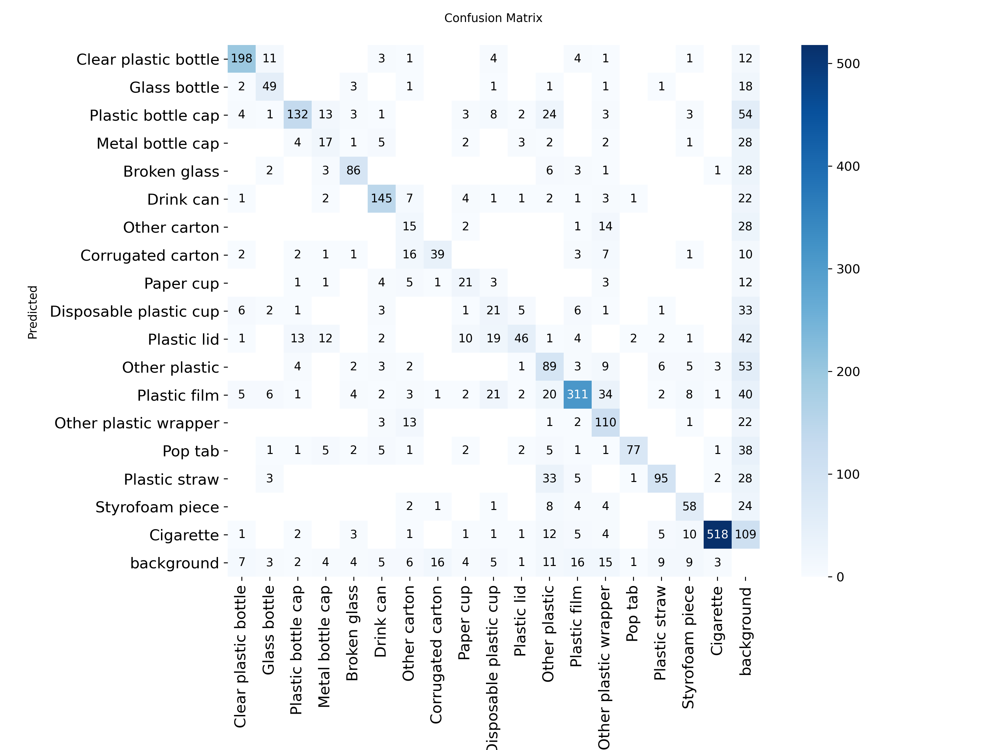


=== Evaluation on VAL split ===
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 875.5±835.9 MB/s, size: 67.1 KB)


val: Scanning /content/taco_yolo/labels/val.cache... 347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 347/347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 87/87 [00:04<00:00, 19.96it/s]


                   all        347        347      0.517      0.594      0.581      0.506
  Clear plastic bottle         30         30      0.733      0.733      0.774      0.711
          Glass bottle         11         11      0.875      0.636      0.784      0.646
    Plastic bottle cap         18         18      0.412      0.778       0.52      0.396
      Metal bottle cap         12         12      0.417      0.417      0.386      0.347
          Broken glass         12         12      0.667      0.833      0.844      0.619
             Drink can         19         19        0.6      0.632      0.697      0.667
          Other carton         11         11        0.2     0.0909      0.114      0.102
     Corrugated carton          1          1      0.167          1      0.995      0.995
             Paper cup         11         11      0.833      0.455      0.606      0.606
Disposable plastic cup         13         13      0.333      0.385      0.314      0.294
           Plastic li

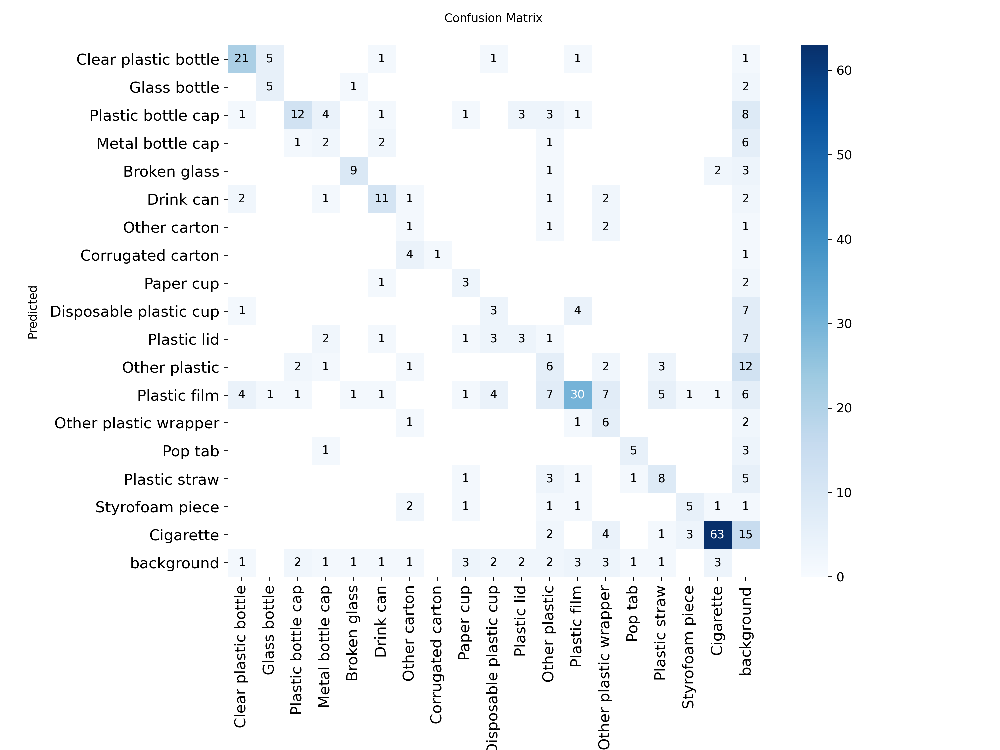


=== Evaluation on TEST split ===
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1173.5±1416.3 MB/s, size: 78.0 KB)


val: Scanning /content/taco_yolo/labels/test... 347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 347/347 [00:00<00:00, 1527.77it/s]

val: New cache created: /content/taco_yolo/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 87/87 [00:05<00:00, 17.13it/s]


                   all        347        347      0.469      0.575      0.555      0.474
  Clear plastic bottle         28         28      0.655      0.679      0.756      0.721
          Glass bottle         15         15      0.667      0.667      0.709      0.648
    Plastic bottle cap         28         28      0.606      0.714      0.565      0.421
      Metal bottle cap         10         10      0.286        0.2      0.213      0.202
          Broken glass         17         17       0.64      0.941       0.83      0.493
             Drink can         29         29      0.679      0.655      0.691      0.636
          Other carton          9          9          0          0          0          0
     Corrugated carton          5          5      0.385          1      0.878      0.734
             Paper cup          4          4      0.286        0.5      0.418      0.376
Disposable plastic cup          6          6      0.167      0.167      0.152      0.152
           Plastic li

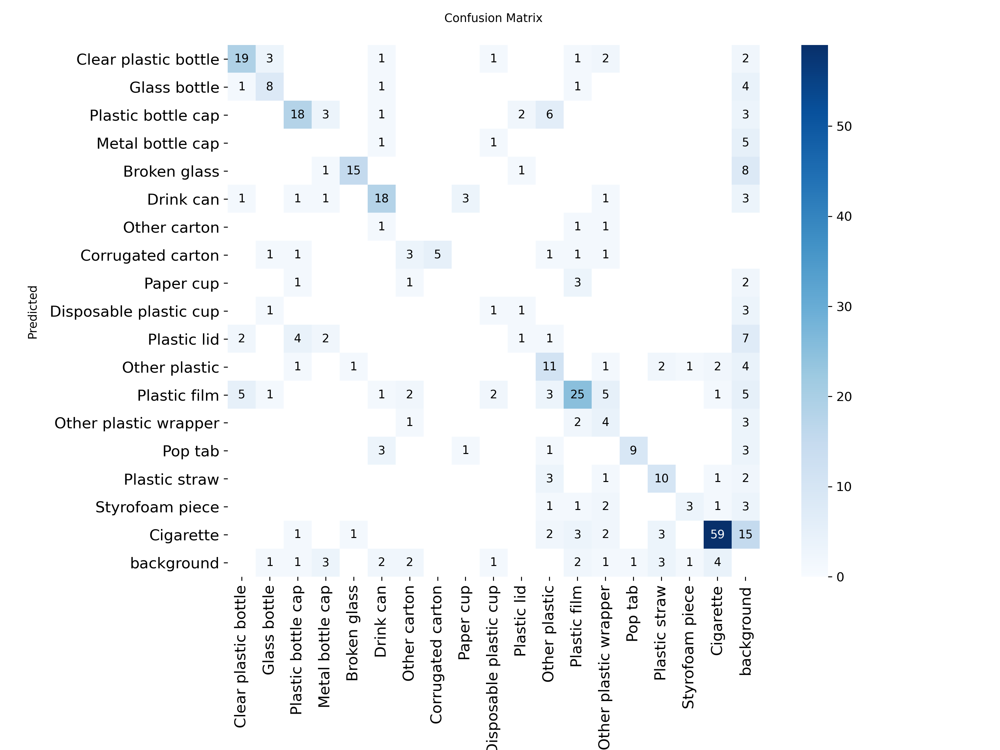

In [12]:
# =========================
# Cell 7 — Train (robust) + Eval on train/val/test
# =========================
from ultralytics import YOLO
import torch, os
from IPython.display import display
from PIL import Image

# --- minimal safety toggles (keep your pattern) ---
SAFE_DEBUG   = True   # <<< CHANGED: set False later after things are stable
FORCE_IMG_SZ = 640    # <<< CHANGED: used only when SAFE_DEBUG=True

# --- stabilize CUDA for clearer errors ---
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"   # <<< CHANGED (add)
torch.backends.cudnn.benchmark = False     # <<< CHANGED (add)

device  = "cuda:0" if torch.cuda.is_available() else "cpu"
imgsz   = 1280 if device.startswith("cuda") else 960
batches = [16, 12, 8, 6, 4, 2, 1] if device.startswith("cuda") else [4, 2, 1]
use_amp = device.startswith("cuda")
workers = 2 if device.startswith("cuda") else 0
multi_scale = True                         # original default

# --- apply safe overrides only for the initial probe ---
if SAFE_DEBUG:                             # <<< CHANGED (block)
    imgsz      = FORCE_IMG_SZ
    batches    = [4, 2, 1] if device.startswith("cuda") else [2, 1]
    use_amp    = False
    workers    = 0
    multi_scale = False
    print(f"[SAFE_DEBUG] imgsz={imgsz}, batches={batches}, amp={use_amp}, workers={workers}, multi_scale={multi_scale}")

# -----------------------------
# 1) Train the model
# -----------------------------
model = YOLO("yolo11s.pt")  # keep your chosen weights

last_err = None
for b in batches:
    try:
        print(f"-> train imgsz={imgsz} batch={b} device={device}")
        results = model.train(
            data=YAML_PATH,
            imgsz=imgsz,
            epochs=20,
            batch=b,
            device=device,
            cache='disk',
            workers=workers,
            amp=use_amp,
            plots=True,
            multi_scale=multi_scale,            # <<< CHANGED: now can be False under SAFE_DEBUG
            mosaic=1.0,
            close_mosaic=10,
            scale=0.7,
            copy_paste=0.0,
            mixup=0.0,
            patience=30,
            max_det=1000,
            rect=False,                         # <<< CHANGED: steadier batches
            deterministic=True,                 # <<< CHANGED: fewer kernel surprises
            name="train_safe_640w0_noamp" if SAFE_DEBUG else "train2",
            verbose=True
        )
        print("Training started ✅")
        break
    except RuntimeError as e:
        last_err = e
        msg = str(e).lower()
        if ("out of memory" in msg or "cublas" in msg or "cuda error" in msg) and device.startswith("cuda"):
            print("OOM/Kernel issue, reducing batch…")
            torch.cuda.empty_cache()
            continue
        raise
if 'results' not in locals():
    raise last_err if last_err else RuntimeError("Training failed to start.")

# -----------------------------
# 2) Load best (or last) weights
# -----------------------------
weights_dir  = os.path.join(results.save_dir, "weights")
best_path    = os.path.join(weights_dir, "best.pt")
last_path    = os.path.join(weights_dir, "last.pt")
weights_path = best_path if os.path.isfile(best_path) else last_path
assert os.path.isfile(weights_path), f"Missing weights in {weights_dir}"

model = YOLO(weights_path)

# -----------------------------
# 3) Helper: evaluate a split and show confusion matrix
# -----------------------------
def _eval_and_show(split_name: str, conf: float = 0.25):
    print(f"\n=== Evaluation on {split_name.upper()} split ===")
    metrics = model.val(
        data=YAML_PATH,
        split=split_name,   # "train" | "val" | "test"
        imgsz=imgsz if not SAFE_DEBUG else FORCE_IMG_SZ,  # <<< CHANGED: match safe size during debug
        batch=4,            # small batch is safer for eval
        device=device,
        iou=0.50,
        conf=conf,
        amp=False if SAFE_DEBUG else use_amp,  # <<< CHANGED: avoid AMP during debug val
        workers=0 if SAFE_DEBUG else workers,  # <<< CHANGED: avoid dataloader races
        plots=True
    )
    try:
        print("mAP@0.50-0.95:", getattr(metrics.box, "map", "N/A"))
        print("mAP@0.50     :", getattr(metrics.box, "map50", "N/A"))
    except Exception:
        pass

    cm_path = os.path.join(str(metrics.save_dir), "confusion_matrix.png")
    if os.path.isfile(cm_path):
        print("Confusion matrix saved to:", cm_path)
        display(Image.open(cm_path))
    else:
        print("Confusion matrix not found at:", cm_path)

# -----------------------------
# 4) Evaluate: train, val, and test (if present)
# -----------------------------
_eval_and_show("train")
_eval_and_show("val")

test_lbl_dir = os.path.join(LBL_OUT, "test")
if os.path.isdir(test_lbl_dir) and any(f.endswith(".txt") for f in os.listdir(test_lbl_dir)):
    _eval_and_show("test")
else:
    print("\n(No test split detected or labels empty; skipping test evaluation)")


###Cell 8 — Validate (val metrics + confusion matrix)

Using weights: /content/runs/detect/train_safe_640w0_noamp/weights/best.pt
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 875.2±515.3 MB/s, size: 28.0 KB)


val: Scanning /content/taco_yolo/labels/val.cache... 347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 347/347 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 87/87 [00:04<00:00, 20.07it/s]


                   all        347        347      0.517      0.594      0.581      0.506
  Clear plastic bottle         30         30      0.733      0.733      0.774      0.711
          Glass bottle         11         11      0.875      0.636      0.784      0.646
    Plastic bottle cap         18         18      0.412      0.778       0.52      0.396
      Metal bottle cap         12         12      0.417      0.417      0.386      0.347
          Broken glass         12         12      0.667      0.833      0.844      0.619
             Drink can         19         19        0.6      0.632      0.697      0.667
          Other carton         11         11        0.2     0.0909      0.114      0.102
     Corrugated carton          1          1      0.167          1      0.995      0.995
             Paper cup         11         11      0.833      0.455      0.606      0.606
Disposable plastic cup         13         13      0.333      0.385      0.314      0.294
           Plastic li

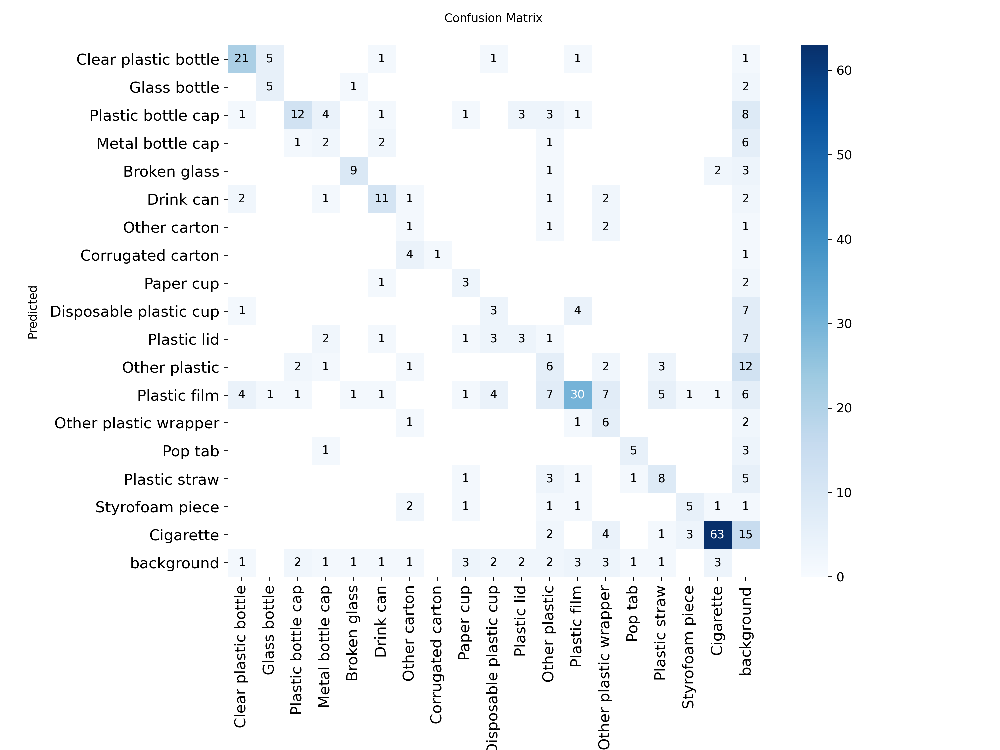

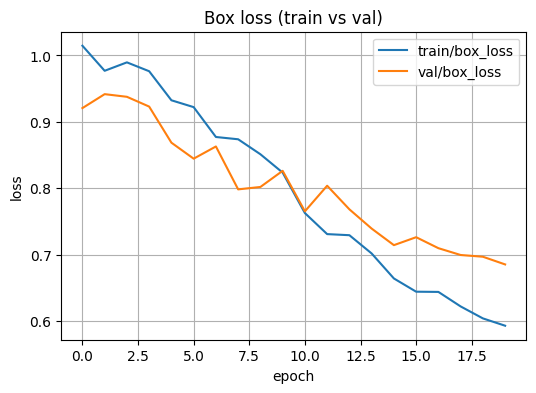

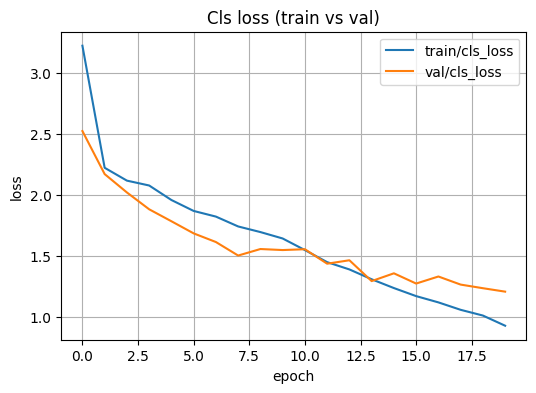

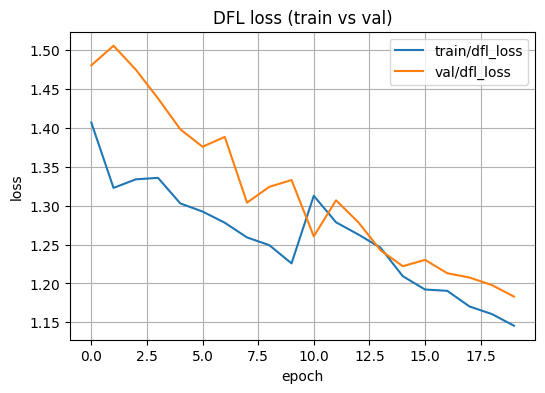

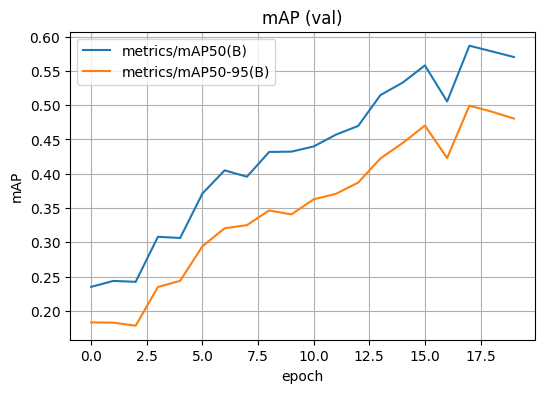

In [13]:
# =========================
# Cell 8 — Validate (val metrics + confusion matrix)
# =========================
import os, glob
from pathlib import Path
from ultralytics import YOLO
from IPython.display import display
from PIL import Image
import torch

# --- sanity: ensure YAML_PATH is defined
assert 'YAML_PATH' in globals(), "YAML_PATH is not defined in this notebook."

# --- find a trained weights file: prefer best.pt, then last.pt
weights_path = "/content/runs/detect/train/weights/best.pt"
if not os.path.isfile(weights_path):
    bests = sorted(glob.glob("/content/runs/detect/train*/weights/best.pt"))
    lasts = sorted(glob.glob("/content/runs/detect/train*/weights/last.pt"))
    assert bests or lasts, "No best.pt/last.pt found; run training first."
    weights_path = (bests or lasts)[-1]
print("Using weights:", weights_path)

# --- eval (stable settings for reproducibility)
model = YOLO(weights_path)
device = 0 if torch.cuda.is_available() else "cpu"
metrics = model.val(
    data=YAML_PATH,
    split="val",
    imgsz=640,
    batch=4,
    device=device,
    iou=0.50,
    conf=0.25,
    workers=0,     # stable
    amp=False,     # eval doesn't need AMP
    plots=True
)

print("mAP@0.50-0.95:", getattr(metrics.box, "map", "N/A"))
print("mAP@0.50     :", getattr(metrics.box, "map50", "N/A"))

cm_path = os.path.join(str(metrics.save_dir), "confusion_matrix.png")
if os.path.isfile(cm_path):
    print("Confusion matrix saved to:", cm_path)
    display(Image.open(cm_path))
else:
    print("Confusion matrix image not found:", cm_path)

# --- OPTIONAL: learning curves (over/underfitting inspection)
# reads the training run's results.csv and plots train vs val losses + mAP
try:
    import pandas as pd
    import matplotlib.pyplot as plt

    train_run_dir = Path(weights_path).parent.parent      # .../trainX
    csv_path = train_run_dir / "results.csv"
    if csv_path.exists():
        df = pd.read_csv(csv_path)

        # Helper to safely plot if columns exist
        def plot_if(cols, title, ylabel=""):
            cols = [c for c in cols if c in df.columns]
            if not cols:
                return
            ax = df[cols].plot(figsize=(6,4))
            ax.set_title(title); ax.set_xlabel("epoch"); ax.set_ylabel(ylabel or title)
            ax.grid(True)
            plt.show()

        # Typical Ultralytics columns:
        plot_if(["train/box_loss","val/box_loss"],      "Box loss (train vs val)", "loss")
        plot_if(["train/cls_loss","val/cls_loss"],      "Cls loss (train vs val)", "loss")
        plot_if(["train/dfl_loss","val/dfl_loss"],      "DFL loss (train vs val)", "loss")
        plot_if(["metrics/mAP50(B)","metrics/mAP50-95(B)"], "mAP (val)", "mAP")
    else:
        print("No results.csv found at:", csv_path)
except Exception as e:
    print("Skipped curves (matplotlib/pandas issue?):", repr(e))


Using run: /content/runs/detect/train_safe_640w0_noamp
CSV: /content/runs/detect/train_safe_640w0_noamp/results.csv


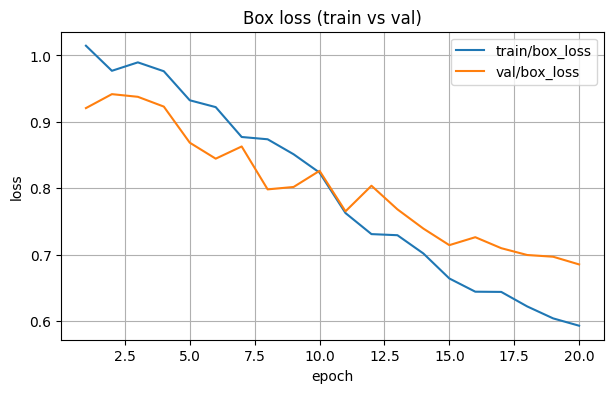

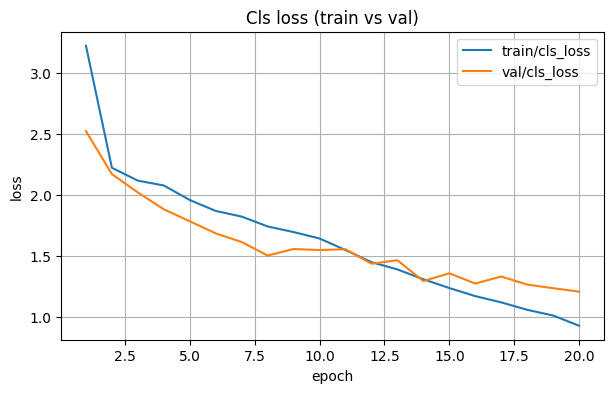

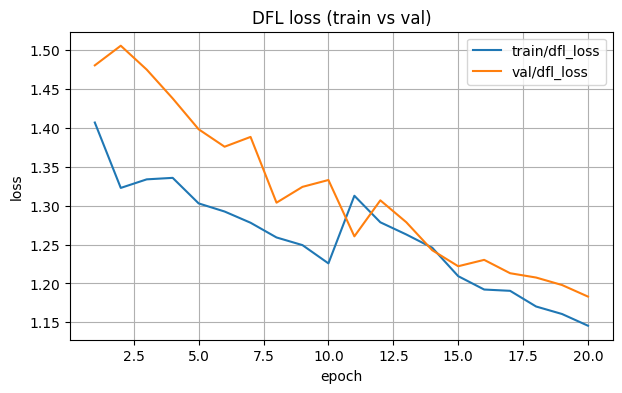

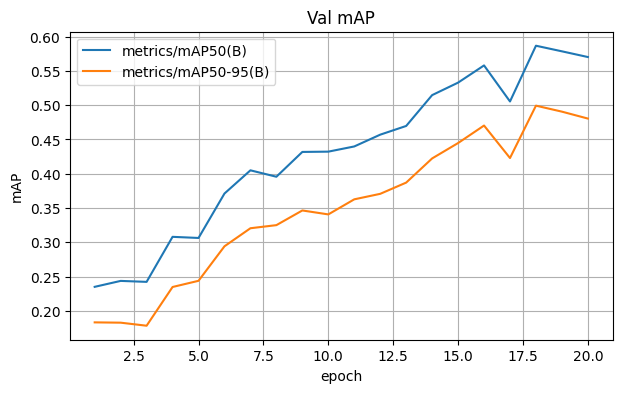

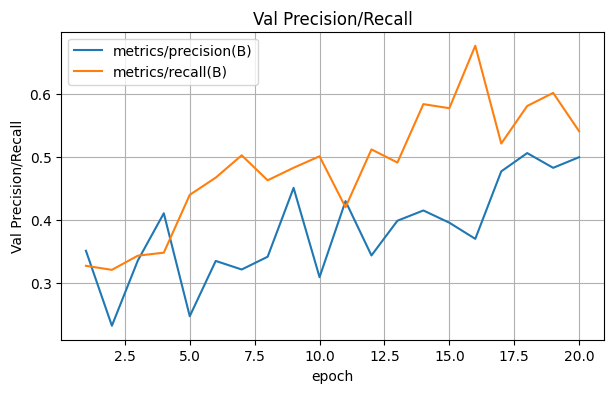

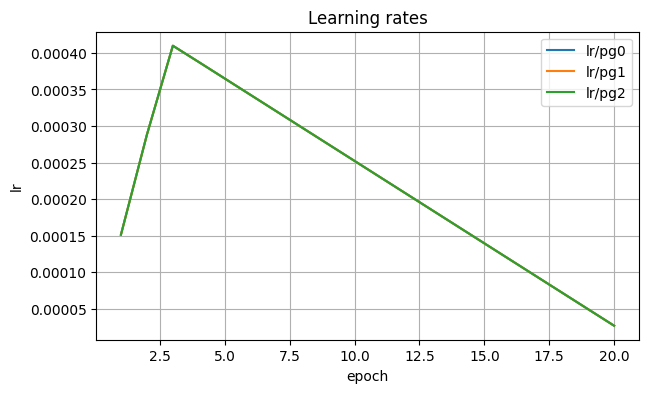


Heuristics: no obvious over/underfitting trend detected (check plots).


In [14]:
# =========================
# Cell 8.99 — Learning Curves (train vs val) + metrics
# =========================
"""
Cell 8 — Learning Curves (train vs val) + metrics

Run AFTER training (and after your validation cell).
Finds the right run folder from `weights_path` (or the newest train run),
loads results.csv, and plots:
- train/val losses (box, cls, dfl)
- val metrics (mAP50, mAP50-95, precision, recall)
- learning rates (if present)

Tip: If a plot is empty, that column wasn't logged in your run.
"""

import os, glob
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# -------- locate the run directory --------
def locate_run_dir():
    """
    Purpose:
        Resolve the Ultralytics training run directory that contains the metrics
        CSV file (`results.csv`).

    Args:
        None. (Reads the globals `weights_path` or `results` if present.)

    Returns:
        Path: The path to the selected run directory (e.g., /content/runs/detect/trainX).

    Raises:
        AssertionError: If no `/content/runs/detect/train*` directories are found.
        FileNotFoundError: If no directory with a `results.csv` can be located.

    Notes:
        Search order:
          1) If a global `weights_path` exists, use its parent run directory if it
             contains `results.csv`.
          2) If a global `results` (from `model.train`) exists, use `results.save_dir`.
          3) Fallback to the most recent `/content/runs/detect/train*` that has `results.csv`.
    """

    # 1) If you validated with a specific weights_path, use that run
    if 'weights_path' in globals():
        p = Path(weights_path).parent.parent  # .../trainX
        if (p / "results.csv").exists():
            return p
    # 2) If you have a `results` object from model.train(...)
    if 'results' in globals():
        p = Path(results.save_dir)
        if (p / "results.csv").exists():
            return p
    # 3) Fallback: latest runs/detect/train*
    candidates = sorted(glob.glob("/content/runs/detect/train*"), key=os.path.getmtime)
    assert candidates, "No runs found under /content/runs/detect/"
    for c in reversed(candidates):
        if os.path.isfile(os.path.join(c, "results.csv")):
            return Path(c)
    raise FileNotFoundError("Could not find a results.csv in any train run.")

run_dir = locate_run_dir()
csv_path = run_dir / "results.csv"
print("Using run:", run_dir)
print("CSV:", csv_path)

# -------- load & helper plotting --------
df = pd.read_csv(csv_path)
epochs = df.index if "epoch" not in df.columns else df["epoch"]

def plot_cols(cols, title, ylabel=""):
    """
    Purpose:
        Plot one or more numeric columns from the training CSV against epoch.

    Args:
        cols (Iterable[str]): Column names to plot if they exist in `df`.
        title (str): Title for the chart.
        ylabel (str, optional): Y-axis label (defaults to `title` if not provided).

    Returns:
        None. Shows a matplotlib figure.

    Notes:
        Uses the globals `df` (loaded from results.csv) and `epochs`.
    """

    cols = [c for c in cols if c in df.columns]
    if not cols:
        return
    plt.figure(figsize=(7,4))
    for c in cols:
        plt.plot(epochs, df[c], label=c)
    plt.title(title)
    plt.xlabel("epoch")
    plt.ylabel(ylabel or title)
    plt.grid(True)
    plt.legend()
    plt.show()

# -------- plots: losses & metrics --------
plot_cols(["train/box_loss","val/box_loss"], "Box loss (train vs val)", "loss")
plot_cols(["train/cls_loss","val/cls_loss"], "Cls loss (train vs val)", "loss")
plot_cols(["train/dfl_loss","val/dfl_loss"], "DFL loss (train vs val)", "loss")

plot_cols(["metrics/mAP50(B)","metrics/mAP50-95(B)"], "Val mAP", "mAP")
plot_cols(["metrics/precision(B)","metrics/recall(B)"], "Val Precision/Recall")

# (optional) LRs if logged
plot_cols(["lr/pg0","lr/pg1","lr/pg2"], "Learning rates", "lr")

# -------- quick over/underfit hints (very simple heuristics) --------
def last_trend(name, window=5):
    """
    Purpose:
        Inspect the last `window` values in `df[name]` and return a coarse
        trend label.

    Args:
        name (str): Column name in `df` to inspect.
        window (int): Number of trailing points to compare.

    Returns:
        str | None:
            - "down" if the last value < first value in the window
            - "up"   otherwise
            - None if the column is missing or has fewer than `window` rows

    Notes:
        This is a very simple heuristic—use plots for real diagnosis.
    """

    if name not in df.columns or len(df) < window:
        return None
    s = df[name].tail(window).to_list()
    return "down" if s[-1] < s[0] else "up"

hints = []
bt = last_trend("train/box_loss")
bv = last_trend("val/box_loss")
mt = "metrics/mAP50-95(B)"
mm = last_trend(mt) if mt in df.columns else None

if bt=="down" and bv=="up":
    hints.append("⚠️ Potential overfitting: train loss down, val loss up.")
if bt=="down" and mm=="down":
    hints.append("⚠️ mAP trending down despite train loss down (possible overfit).")
if bt=="up" and bv=="up":
    hints.append("⚠️ Losses not improving (possible underfitting).")

if hints:
    print("\nHeuristics:")
    for h in hints: print("-", h)
else:
    print("\nHeuristics: no obvious over/underfitting trend detected (check plots).")


To judge over/underfitting you mainly need the loss curves (train vs val) and val mAP/precision/recall you just plotted. Quick reads:

* Overfitting ➜ train losses keep going ↓ while val losses ↑ or val mAP peaks then falls.

* Underfitting ➜ both train & val losses stay high / improve slowly; mAP stays low/flat.

---------------------------------------------
**Result of plots**

* Box / Cls / DFL losses: train ↓ steadily; val ↓ but flattens after ~epoch 8–12 ⇒ a small generalization gap (mild overfitting risk), but nothing alarming yet.

* Val mAP: keeps climbing through epoch 20 (mAP50 ≈ 0.47, mAP50-95 ≈ 0.42) ⇒ you likely haven’t converged.

* Precision/Recall: recall rises from ~0.15 → ~0.5; precision is noisy (0.4–0.6). This often stabilizes with longer training + slightly larger imgsz.

---------------------------------------------
**Train longer with a better schedule**

* Switch to cosine LR and don’t decay to near-zero:
  * cos_lr=True, lrf=0.2
  * Increase epochs (e.g., 60). Your mAP was still rising at 20.

* Keep multi-scale OFF for now
  * multi_scale=False (bring it back later if you want; it spikes memory and adds noise).

* Use effective large batch via accumulation (if GPU limits batch)
  * Add: accumulate = max(round(64 / b), 1) inside your batch loop so the effective batch ≈64.

* Bump resolution modestly once stable

  * If your 640 run is solid, try imgsz=896 (or 960 if it fits). This helps recall, especially on smaller objects.

* Speed/stability
  * Once stable, turn amp=True, workers=2.

### Cell 9 — 5-Fold Cross Validation (CV=5)

In [15]:
# =========================
# Cell 9a.1 — Filter rare classes (< N_FOLDS images) & rebuild folds
# =========================
"""
Purpose:
Remove any images that contain classes appearing in fewer than N_FOLDS images,
so StratifiedKFold won't warn. Also prints the skipped class IDs and names.

Args:
CV_STATE.pool_imgs : list[str]
    Image pool built from YAML train ∪ val.
CV_STATE.folds     : list
    (Will be replaced after filtering.)
N_FOLDS            : int
    Number of folds (5 in your setup).
YAML_PATH          : str
    Dataset yaml path (to read 'names' for printing class names).

Returns:
(No Python return)
- Updates CV_STATE["pool_imgs"] to a filtered list (images containing only classes with ≥ N_FOLDS images).
- Rebuilds CV_STATE["folds"] using StratifiedKFold (or shuffled fallback).
- Prints:
  * rare class ids + counts
  * rare class names (if available in yaml)
  * pool size before/after
  * new fold val sizes

"""

# ------------------------------
# Preconditions
# ------------------------------
#assert 'CV_STATE' in globals(), "Run Cell 9a first to build CV_STATE."
# assert 'N_FOLDS' in globals(), "N_FOLDS not set (should be defined in Cell 9a)."
# assert 'YAML_PATH' in globals(), "YAML_PATH not found; define it as in Cell 7/9a."

# ------------------------------
# Helpers (follow our pattern: small, well-documented)
# ------------------------------
def _img_to_label(img_path: str) -> Path:
    """
    Purpose:
    Map an image path to its expected YOLO label path.

    Args:
    img_path : str
        Path to an image file (…/images/…/xxx.jpg, etc).

    Returns:
    Path
        Candidate label path (…/labels/…/xxx.txt if possible; otherwise sibling xxx.txt).
    """
    ip = Path(img_path)
    # 1) sibling .txt
    sib = ip.with_suffix(".txt")
    if sib.exists():
        return sib
    # 2) /images/ → /labels/
    parts = list(ip.parts)
    if "images" in parts:
        i = parts.index("images")
        parts[i] = "labels"
        return Path(*parts).with_suffix(".txt")
    # 3) fallback sibling
    return ip.with_suffix(".txt")

def _image_classes(img_path: str) -> set:
    """
    Purpose:
    Get the set of distinct class IDs present in this image's label.

    Args:
    img_path : str
        Path to an image file.

    Returns:
    set[int]
        Unique class IDs found in the label file; empty set if no label or unreadable.
    """
    lp = _img_to_label(img_path)
    cls_set = set()
    try:
        if lp.exists():
            for ln in lp.read_text().splitlines():
                ln = ln.strip()
                if not ln:
                    continue
                cid = int(float(ln.split()[0]))
                cls_set.add(cid)
    except Exception:
        pass
    return cls_set

def _primary_class_for_image(img_path: str) -> int:
    """
    Purpose:
    Retrieve the "primary" class for stratification (first labeled class in the file).

    Args:
    img_path : str
        Path to an image.

    Returns:
    int
        First class ID found, or 0 if no label/empty/unreadable.
    """
    lp = _img_to_label(img_path)
    try:
        if lp.exists():
            for ln in lp.read_text().splitlines():
                ln = ln.strip()
                if ln:
                    return int(float(ln.split()[0]))
    except Exception:
        pass
    return 0

def _make_folds(images: list, k: int) -> list:
    """
    Purpose:
    Build k folds from a list of images. Prefer StratifiedKFold (by primary class);
    fall back to a shuffled K-way split if sklearn is unavailable.

    Args:
    images : list[str]
        Image paths to split.
    k : int
        Number of folds.

    Returns:
    list[tuple[list[str], list[str]]]
        List of (train_list, val_list) tuples.
    """
    try:
        from sklearn.model_selection import StratifiedKFold
        y = [_primary_class_for_image(p) for p in images]
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
        return [([images[i] for i in tr], [images[i] for i in va]) for tr, va in skf.split(images, y)]
    except Exception as e:
        print("[INFO] StratifiedKFold not available; using shuffled split:", repr(e))
        idx = list(range(len(images)))
        random.Random(42).shuffle(idx)
        parts = [idx[i::k] for i in range(k)]
        folds = []
        for i in range(k):
            val_idx = set(parts[i])
            train = [images[j] for j in idx if j not in val_idx]
            val   = [images[j] for j in parts[i]]
            folds.append((train, val))
        return folds

# ------------------------------
# Load names for pretty printing
# ------------------------------
with open(YAML_PATH, "r") as f:
    yml = yaml.safe_load(f)
raw_names = yml.get("names", None)

# Normalize names → dict[int → str]
names_map = {}
if isinstance(raw_names, dict):
    for k, v in raw_names.items():
        try:
            names_map[int(k)] = str(v)
        except Exception:
            pass
elif isinstance(raw_names, list):
    for i, v in enumerate(raw_names):
        names_map[i] = str(v) if v is not None else f"class_{i}"

# ------------------------------
# Count image-level presence per class
# ------------------------------
pool = list(CV_STATE["pool_imgs"])
per_img_classes = {}
class_img_count = Counter()

for img in pool:
    cls_set = _image_classes(img)
    per_img_classes[img] = cls_set
    for c in cls_set:
        class_img_count[c] += 1

# Rare classes: appear in fewer than N_FOLDS images
rare_ids = sorted([c for c, n in class_img_count.items() if n < N_FOLDS],
                  key=lambda c: class_img_count[c])

print(f"[INFO] Classes with < {N_FOLDS} images (by image presence):")
if not rare_ids:
    print(" - None (great!)")
else:
    for c in rare_ids:
        nm = names_map.get(c, f"class_{c}")
        print(f" - id={c:>3}  count={class_img_count[c]:>3}  name='{nm}'")

# ------------------------------
# Filter pool: drop any image containing ANY rare class
# ------------------------------
before = len(pool)
if rare_ids:
    rare_set = set(rare_ids)
    filtered_pool = [img for img in pool if per_img_classes[img].isdisjoint(rare_set)]
else:
    filtered_pool = pool[:]

after = len(filtered_pool)
print(f"[FILTER] pool size: {before} → {after}  (removed {before-after})")

# Safety: ensure we didn't wipe out everything
assert after > 0, "Filtering removed all images. Consider reducing N_FOLDS or keeping rare classes."

# ------------------------------
# Rebuild folds on the filtered pool
# ------------------------------
new_folds = _make_folds(filtered_pool, N_FOLDS)
print("[FOLDS] new val sizes:", [len(v) for _, v in new_folds])

# ------------------------------
# Update shared CV_STATE
# ------------------------------
CV_STATE["pool_imgs"]            = filtered_pool
CV_STATE["folds"]                = new_folds
CV_STATE["skipped_class_ids"]    = rare_ids
CV_STATE["skipped_class_names"]  = [names_map.get(c, f"class_{c}") for c in rare_ids]

print("[OK] Updated CV_STATE with filtered pool + rebuilt folds.")




[INFO] CV_STATE not found. Initializing from YAML_PATH...
[INFO] Initialized CV_STATE with 3122 images from train/val splits.
[INFO] Classes with < 5 images (by image presence):
 - None (great!)
[FILTER] pool size: 3122 → 3122  (removed 0)
[FOLDS] new val sizes: [625, 625, 624, 624, 624]
[OK] Updated CV_STATE with filtered pool + rebuilt folds.


In [16]:
# =========================
# Cell 9a.2 — Physically remove rare-class images (< N_FOLDS) from train/val
# =========================
"""
Purpose:
Physically move every image (and its label .txt) that contains any class appearing
in fewer than N_FOLDS images within the *train ∪ val* pool. Test split is
intentionally untouched. After moving, rebuild the CV pool and folds so you can
proceed with Cell 9.2 and Cell 9.3.

Args (reads from globals):
YAML_PATH : str
    Dataset YAML path (to resolve train/val roots and load class names).
N_FOLDS   : int
    Threshold for "rare" classes. With 5-fold CV, this is 5.
CV_STATE  : dict (optional)
    If present, will be updated with the new pool and folds.

Returns:
(No Python return)
- Moves rare-class images + labels into '<dataset_root>/_rare_removed/{train|val}/'
- Removes Ultralytics label caches so a clean rescan occurs.
- Rebuilds CV_STATE["pool_imgs"] and CV_STATE["folds"] (like 9a.1) and prints fold sizes.
- Prints which classes were considered rare (ids + names) and how many files were moved.
"""

# ------------------------------
# Preconditions
# ------------------------------
import yaml, glob, shutil, random, os
from pathlib import Path
from collections import Counter

assert 'YAML_PATH' in globals(), "YAML_PATH not found; define it as in Cell 7/9a."
assert 'N_FOLDS' in globals(), "N_FOLDS not set; define it as in Cell 9a (e.g., 5)."

# ------------------------------
# Helpers (pattern-matched to 9a.1, with docstrings)
# ------------------------------
IMG_EXTS = (".jpg",".jpeg",".png",".bmp",".tif",".tiff",".webp")

def _img_to_label(img_path: str) -> Path:
    """
    Purpose:
    Map an image path to its expected YOLO label path.

    Args:
    img_path : str
        Path to an image file (…/images/…/xxx.jpg, etc).

    Returns:
    Path
        Candidate label path (…/labels/…/xxx.txt if possible; otherwise sibling xxx.txt).
    """
    ip = Path(img_path)
    # 1) sibling .txt
    sib = ip.with_suffix(".txt")
    if sib.exists():
        return sib
    # 2) /images/ → /labels/
    parts = list(ip.parts)
    if "images" in parts:
        i = parts.index("images")
        parts[i] = "labels"
        return Path(*parts).with_suffix(".txt")
    # 3) fallback sibling
    return ip.with_suffix(".txt")

def _image_classes(img_path: str) -> set:
    """
    Purpose:
    Get the set of distinct class IDs present in this image's label.

    Args:
    img_path : str
        Path to an image file.

    Returns:
    set[int]
        Unique class IDs found in the label file; empty set if no label or unreadable.
    """
    lp = _img_to_label(img_path)
    cls_set = set()
    try:
        if lp.exists():
            for ln in lp.read_text().splitlines():
                ln = ln.strip()
                if not ln:
                    continue
                cid = int(float(ln.split()[0]))
                cls_set.add(cid)
    except Exception:
        pass
    return cls_set

def _primary_class_for_image(img_path: str) -> int:
    """
    Purpose:
    Retrieve the "primary" class for stratification (first labeled class in the file).

    Args:
    img_path : str
        Path to an image.

    Returns:
    int
        First class ID found, or 0 if no label/empty/unreadable.
    """
    lp = _img_to_label(img_path)
    try:
        if lp.exists():
            for ln in lp.read_text().splitlines():
                ln = ln.strip()
                if ln:
                    return int(float(ln.split()[0]))
    except Exception:
        pass
    return 0

def _make_folds(images: list, k: int) -> list:
    """
    Purpose:
    Build k folds from a list of images. Prefer StratifiedKFold (by primary class);
    fall back to a shuffled K-way split if sklearn is unavailable.

    Args:
    images : list[str]
        Image paths to split.
    k : int
        Number of folds.

    Returns:
    list[tuple[list[str], list[str]]]
        List of (train_list, val_list) tuples.
    """
    try:
        from sklearn.model_selection import StratifiedKFold
        y = [_primary_class_for_image(p) for p in images]
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
        return [([images[i] for i in tr], [images[i] for i in va]) for tr, va in skf.split(images, y)]
    except Exception as e:
        print("[INFO] StratifiedKFold not available; using shuffled split:", repr(e))
        idx = list(range(len(images)))
        random.Random(42).shuffle(idx)
        parts = [idx[i::k] for i in range(k)]
        folds = []
        for i in range(k):
            val_idx = set(parts[i])
            train = [images[j] for j in idx if j not in val_idx]
            val   = [images[j] for j in parts[i]]
            folds.append((train, val))
        return folds

def _resolve_entry_to_images(entry, base_dir=None) -> list:
    """
    Purpose:
    Resolve YAML 'train'/'val' entries into image paths (dirs/globs/txt/list supported).

    Args:
    entry : Any
        YAML field: string path, glob, .txt list, directory, or list of them.
    base_dir : str | Path | None
        Dataset root ('path' in YAML). Non-absolute entries are resolved against it.

    Returns:
    list[str]
        Image file paths.
    """
    def _one(e):
        if e is None: return []
        p = Path(str(e))
        if base_dir and not p.is_absolute():
            p = (Path(base_dir) / p).resolve()

        # .txt list of images or directories/globs
        if p.suffix.lower() == ".txt" and p.exists():
            out=[]
            for ln in p.read_text().splitlines():
                ln = ln.strip()
                if not ln: continue
                q = Path(ln)
                if not q.is_absolute() and base_dir:
                    q = (Path(base_dir) / q).resolve()
                if q.is_dir():
                    out += [str(x) for x in q.rglob("*") if x.suffix.lower() in IMG_EXTS]
                elif q.suffix.lower() in IMG_EXTS and q.exists():
                    out.append(str(q))
                else:
                    # allow glob inside txt
                    for m in glob.glob(str(q)):
                        mp = Path(m)
                        if mp.is_dir():
                            out += [str(x) for x in mp.rglob("*") if x.suffix.lower() in IMG_EXTS]
                        elif mp.suffix.lower() in IMG_EXTS:
                            out.append(str(mp))
            return out

        # directory
        if p.exists() and p.is_dir():
            return [str(x) for x in p.rglob("*") if x.suffix.lower() in IMG_EXTS]

        # glob
        matches = glob.glob(str(p))
        if matches:
            out=[]
            for m in matches:
                mp = Path(m)
                if mp.is_dir():
                    out += [str(x) for x in mp.rglob("*") if x.suffix.lower() in IMG_EXTS]
                elif mp.suffix.lower() in IMG_EXTS:
                    out.append(str(mp))
            return out

        # single image
        if p.exists() and p.suffix.lower() in IMG_EXTS:
            return [str(p)]

        return []

    if entry is None:
        return []
    if isinstance(entry, (list, tuple)):
        out=[]
        for sub in entry: out += _one(sub)
        return out
    return _one(entry)

def _split_name(img_path: str) -> str:
    """
    Purpose:
    Infer split name ('train'/'val') heuristically from the path.

    Args:
    img_path : str

    Returns:
    str
        'train', 'val', or 'unknown' if not matched.
    """
    p = str(img_path)
    if "/train/" in p or p.endswith("/train") or "/images/train" in p:
        return "train"
    if "/val/" in p or p.endswith("/val") or "/images/val" in p:
        return "val"
    return "unknown"

# ------------------------------
# Load YAML and names (for pretty printing)
# ------------------------------
with open(YAML_PATH, "r") as f:
    yml = yaml.safe_load(f) or {}

base_dir  = yml.get("path", "") or ""
train_ent = yml.get("train", None)
val_ent   = yml.get("val",   None)

raw_names = yml.get("names", None)
names_map = {}
if isinstance(raw_names, dict):
    for k, v in raw_names.items():
        try:
            names_map[int(k)] = str(v)
        except Exception:
            pass
elif isinstance(raw_names, list):
    for i, v in enumerate(raw_names):
        names_map[i] = str(v) if v is not None else f"class_{i}"

# ------------------------------
# Build pool (train ∪ val) fresh from disk
# ------------------------------
train_imgs = _resolve_entry_to_images(train_ent, base_dir)
val_imgs   = _resolve_entry_to_images(val_ent,   base_dir)
pool       = sorted(set(train_imgs + val_imgs))
assert pool, "No images found in train/val. Check your YAML paths."

# ------------------------------
# Count per-class image presence and find rare classes
# ------------------------------
per_img_classes = {}
class_img_count = Counter()
for img in pool:
    s = _image_classes(img)
    per_img_classes[img] = s
    for c in s:
        class_img_count[c] += 1

rare_ids = sorted([c for c, n in class_img_count.items() if n < N_FOLDS],
                  key=lambda c: class_img_count[c])

print(f"[INFO] Classes with < {N_FOLDS} images (by image presence):")
if not rare_ids:
    print(" - None (great!)")
else:
    for c in rare_ids:
        nm = names_map.get(c, f"class_{c}")
        print(f" - id={c:>3}  count={class_img_count[c]:>3}  name='{nm}'")

# ------------------------------
# Move rare-class images + labels to quarantine (skip test)
# ------------------------------
moved = 0
if rare_ids:
    rare_set = set(rare_ids)
    ds_root  = Path(base_dir) if base_dir else Path("/content/taco_yolo")
    quarantine = ds_root / "_rare_removed"
    quarantine.mkdir(parents=True, exist_ok=True)

    for img in pool:
        if not per_img_classes[img].isdisjoint(rare_set):
            split = _split_name(img)
            # only act on train/val; ignore anything else
            if split not in {"train", "val"}:
                continue
            dst_img_dir = quarantine / split / "images"
            dst_lbl_dir = quarantine / split / "labels"
            dst_img_dir.mkdir(parents=True, exist_ok=True)
            dst_lbl_dir.mkdir(parents=True, exist_ok=True)

            img_p = Path(img)
            lbl_p = _img_to_label(img)

            # move image
            try:
                shutil.move(str(img_p), str(dst_img_dir / img_p.name))
                moved += 1
            except Exception:
                pass

            # move label if exists
            if lbl_p.exists():
                try:
                    shutil.move(str(lbl_p), str(dst_lbl_dir / lbl_p.name))
                except Exception:
                    pass

    print(f"[MOVE] moved {moved} images (+ labels when present) into: {quarantine}")
else:
    print("[MOVE] No rare classes found; moved 0 files.")

# ------------------------------
# Delete Ultralytics label caches so it rescans
# ------------------------------
lbl_cache_train = (Path(base_dir) / "labels" / "train.cache") if base_dir else Path("/content/taco_yolo/labels/train.cache")
lbl_cache_val   = (Path(base_dir) / "labels" / "val.cache")   if base_dir else Path("/content/taco_yolo/labels/val.cache")
for c in [lbl_cache_train, lbl_cache_val]:
    if c.exists():
        try:
            c.unlink()
            print(f"[CACHE] removed {c}")
        except Exception:
            pass

# ------------------------------
# Rebuild pool and folds after the move (train ∪ val only)
# ------------------------------
train_imgs2 = _resolve_entry_to_images(train_ent, base_dir)
val_imgs2   = _resolve_entry_to_images(val_ent,   base_dir)
pool2       = sorted(set(train_imgs2 + val_imgs2))
print(f"[POOL] before={len(pool)} → after={len(pool2)}")

assert pool2, "All images removed — reduce strictness or restore from '_rare_removed'."

folds = _make_folds(pool2, N_FOLDS)
print("[FOLDS] val sizes:", [len(v) for _, v in folds])

# ------------------------------
# Update CV_STATE and finish
# ------------------------------
if 'CV_STATE' not in globals():
    CV_STATE = {}
CV_STATE["pool_imgs"] = pool2
CV_STATE["folds"]     = folds
print("[OK] CV_STATE refreshed. You can now run Cell 9.2 → 9.3.")


[INFO] Classes with < 5 images (by image presence):
 - None (great!)
[MOVE] No rare classes found; moved 0 files.
[CACHE] removed /content/taco_yolo/labels/train.cache
[CACHE] removed /content/taco_yolo/labels/val.cache
[POOL] before=3122 → after=3122
[FOLDS] val sizes: [625, 625, 624, 624, 624]
[OK] CV_STATE refreshed. You can now run Cell 9.2 → 9.3.


In [17]:
# =========================
# Cell 9a.3 — Fold integrity & label sanity report (pre-flight checks)
# =========================
"""
Purpose:
Before materializing or training folds, perform integrity checks on the current
CV_STATE["folds"] (built in 9a / 9a.1 / 9a.2):
- Ensure no train/val overlap inside each fold
- Verify label files exist alongside images
- Scan label lines for format errors and out-of-range values
- Summarize per-fold, per-class coverage (images & boxes)
- Store a compact report in CV_STATE for quick debugging

Args (reads from globals):
CV_STATE : dict
    Must contain:
      - "folds": list[tuple[list[str], list[str]]] as produced by 9a/9a.1/9a.2
YAML_PATH : str
    Dataset YAML path; used to read 'names' and 'nc' for validation.

Returns:
(No Python return)
- Prints a summary per fold (sizes, overlaps, label issues, class coverage).
- Writes lightweight "bad label" lists into a temp report dir.
- Updates:
    CV_STATE["fold_reports"] : list[dict]  (one dict per fold with key stats)
    CV_STATE["names"]        : normalized names (list or dict[int->str])
    CV_STATE["nc"]           : class count (int)
"""

# ------------------------------
# Config (edit as needed)
# ------------------------------
K_FOLDS  = 3
EPOCHS   = 10           # keep modest for CV
IMG_SIZE = 640
CONF_EVAL = 0.25
IOU_EVAL  = 0.50
SAFE_BATCHES_CUDA = [4, 2, 1]
SAFE_BATCHES_CPU  = [2, 1]

# ------------------------------
# Imports
# ------------------------------
import os, glob, shutil, time, csv
from pathlib import Path
import yaml
import random
import numpy as np
import pandas as pd

try:
    from ultralytics import YOLO
    import torch
except Exception as e:
    raise ImportError("Ultralytics (YOLO) and torch must be installed before running Cell 9.3.") from e

# Fallbacks to globals from earlier cells
try:
    YAML_PATH
except NameError:
    raise AssertionError("YAML_PATH is not defined. Run your earlier cells first to build taco_data.yaml.")

try:
    OUT_ROOT
except NameError:
    OUT_ROOT = "/content/taco_yolo"

try:
    IMG_EXTS
except NameError:
    IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

try:
    RAND_SEED
except NameError:
    RAND_SEED = 42

random.seed(RAND_SEED)
np.random.seed(RAND_SEED)

# ------------------------------
# Helpers
# ------------------------------
def _timestamp():
    """Return a compact timestamp string for run folder naming."""
    return time.strftime("%Y%m%d_%H%M%S")

def _read_yaml_names(yaml_path: str):
    """Read 'names' list (or dict) from a YOLO data YAML."""
    cfg = yaml.safe_load(open(yaml_path, "r"))
    if isinstance(cfg.get("names"), list):
        names = cfg["names"]
    else:
        names = [cfg["names"][i] for i in sorted(map(int, cfg["names"].keys()))]
    return cfg, names

def _resolve_entry_to_images(root_path: Path, entry: str):
    """
    Purpose:
        Resolve a YAML entry (e.g., 'images/train') to a sorted list of absolute image paths.

    Args:
        root_path (Path): Base 'path' from YAML (or OUT_ROOT).
        entry (str): Entry under 'path' (e.g. 'images/train') or absolute path.

    Returns:
        List[str]: absolute image file paths under that entry.
    """
    p = Path(entry)
    p = p if p.is_absolute() else (root_path / entry)
    files = []
    for ext in IMG_EXTS:
        files.extend(glob.glob(str(p / f"*{ext}")))
    return sorted(files)

def _img_to_label_path(img_path: str, dataset_root: Path):
    """
    Purpose:
        Given an absolute image path inside a typical YOLO dataset structure:
            .../<dataset_root>/images/<split>/<name>.<ext>
        return the expected label file path:
            .../<dataset_root>/labels/<split>/<name>.txt

    Args:
        img_path (str): Absolute path to an image under dataset_root/images/<split>.
        dataset_root (Path): 'path' field in YAML (absolute).

    Returns:
        Path: expected label path.
    """
    ip = Path(img_path)
    try:
        idx = ip.parts.index("images")
        split = ip.parts[idx+1]
    except Exception:
        # Fallback: naive replace
        return Path(str(ip).replace("/images/", "/labels/")).with_suffix(".txt")
    base = ip.stem + ".txt"
    return dataset_root / "labels" / split / base

def _load_label_lines(label_path: Path):
    """Load label lines from a .txt. Returns a list (empty if missing or unreadable)."""
    try:
        with open(label_path, "r") as f:
            lines = [ln.rstrip("\n") for ln in f if ln.strip()]
        return lines
    except Exception:
        return []

def _pair_pool(images, dataset_root: Path):
    """
    Purpose:
        Make (img_path, lbl_path) pairs and filter only those that have existing labels.

    Returns:
        pool_pairs (List[Tuple[str, str]]), missing_lbl (List[str])
    """
    pool_pairs, missing_lbl = [], []
    for ip in images:
        lp = _img_to_label_path(ip, dataset_root)
        if lp.is_file():
            pool_pairs.append((ip, str(lp)))
        else:
            missing_lbl.append(ip)
    return pool_pairs, missing_lbl

def _write_fold_yaml(dst_root: Path, names):
    """
    Purpose:
        Write a minimal Ultralytics data YAML pointing at the fold dataset.

    Args:
        dst_root (Path): Root of this fold dataset (contains images/, labels/)
        names (List[str]): Class names.

    Returns:
        Path: YAML path written.
    """
    y = dst_root / "data.yaml"
    with open(y, "w") as f:
        f.write(f"path: {dst_root}\n")
        f.write( "train: images/train\n")
        f.write( "val: images/val\n")
        f.write( "names:\n")
        for i, n in enumerate(names):
            f.write(f"  {i}: {n}\n")
    return y

def write_split_pairs(dst_root: Path, split_name: str, pairs):
    """
    Purpose:
        Copy images and labels into a fold dataset split and return simple stats.

    Args:
        dst_root (Path): Fold dataset root (contains images/, labels/).
        split_name (str): "train" | "val".
        pairs (List[Tuple[str, str]]): (img_path, lbl_path) to copy.

    Returns:
        dict: {
            'missing_img': int,   # image file missing at source
            'empty_lbl'  : int,   # label .txt empty or unreadable
            'boxes_total': int,   # total rows written across labels
            'written'    : int    # images successfully written
        }
    """
    im_dir = dst_root / "images" / split_name
    lb_dir = dst_root / "labels" / split_name
    im_dir.mkdir(parents=True, exist_ok=True)
    lb_dir.mkdir(parents=True, exist_ok=True)

    stats = {'missing_img': 0, 'empty_lbl': 0, 'boxes_total': 0, 'written': 0}

    for img_path, lbl_path in pairs:
        if not os.path.isfile(img_path):
            stats['missing_img'] += 1
            continue

        # Copy image
        dst_img = im_dir / Path(img_path).name
        if not dst_img.exists():
            shutil.copy2(img_path, dst_img)

        # Read and write label
        lines = _load_label_lines(Path(lbl_path))
        stats['boxes_total'] += len(lines)
        if not lines:
            stats['empty_lbl'] += 1

        dst_lbl = lb_dir / (Path(img_path).stem + ".txt")
        with open(dst_lbl, "w") as f:
            f.write("\n".join(lines))

        stats['written'] += 1

    print(f"{split_name}: images written={stats['written']}, empty label files={stats['empty_lbl']}, missing images={stats['missing_img']}")
    return stats

# ------------------------------
# Build the CV pool from your current YAML
# ------------------------------
cfg, names = _read_yaml_names(YAML_PATH)
dataset_root = Path(cfg.get("path", OUT_ROOT))
train_entry  = cfg.get("train", "images/train")
val_entry    = cfg.get("val",   "images/val")
test_entry   = cfg.get("test")  # may be None

# Resolve images
train_imgs = _resolve_entry_to_images(dataset_root, train_entry)
val_imgs   = _resolve_entry_to_images(dataset_root, val_entry)
print(f"[CV] YAML path: {dataset_root}")
print(f"[CV] train entry: {train_entry} -> {len(train_imgs)} images")
print(f"[CV] val   entry: {val_entry}   -> {len(val_imgs)} images")

# Pair with labels and filter
pool_pairs, train_missing_lbl = _pair_pool(train_imgs, dataset_root)
val_pairs,  val_missing_lbl   = _pair_pool(val_imgs,   dataset_root)
pool_pairs.extend(val_pairs)

print("train missing labels:", len(train_missing_lbl))
print("val   missing labels:", len(val_missing_lbl))
assert pool_pairs, "No (image,label) pairs found under train/val from your YAML."

# Keep test untouched (not included in pool)
if test_entry:
    test_imgs = set(_resolve_entry_to_images(dataset_root, test_entry))
    # (We do nothing further; just noting test is excluded.)

# ------------------------------
# Make K folds (shuffle once with seed)
# ------------------------------
idx = np.arange(len(pool_pairs))
rng = np.random.RandomState(RAND_SEED)
rng.shuffle(idx)
folds = np.array_split(idx, K_FOLDS)

device  = "cuda:0" if torch.cuda.is_available() else "cpu"
batches = SAFE_BATCHES_CUDA if device.startswith("cuda") else SAFE_BATCHES_CPU
use_amp = device.startswith("cuda")
workers = 2 if device.startswith("cuda") else 0
print(f"[SAFE_DEBUG] imgsz={IMG_SIZE}, batches={batches}, amp={use_amp}, workers={workers}, multi_scale=False")

# ------------------------------
# Prepare CV run directory + summary
# ------------------------------
cv_root = Path(f"/content/runs/cv_5fold_{_timestamp()}")
cv_root.mkdir(parents=True, exist_ok=True)

summary_rows = []
summary_csv  = cv_root / "cv_summary.csv"

def _append_summary(row):
    # Append to in-memory table AND write/overwrite CSV each time (robust to interrupts)
    summary_rows.append(row)
    df = pd.DataFrame(summary_rows)
    df.to_csv(summary_csv, index=False)

# ------------------------------
# Run folds
# ------------------------------
for k in range(K_FOLDS):
    print(f"\n========== Fold {k+1}/{K_FOLDS} ==========")
    val_idx = folds[k]
    tr_idx  = np.concatenate([folds[j] for j in range(K_FOLDS) if j != k])

    train_set = [pool_pairs[i] for i in tr_idx.tolist()]
    val_set   = [pool_pairs[i] for i in val_idx.tolist()]
    print(f"fold {k}: train={len(train_set)}  val={len(val_set)}")

    fold_root = cv_root / f"fold_{k}" / "dataset"
    (fold_root / "images").mkdir(parents=True, exist_ok=True)
    (fold_root / "labels").mkdir(parents=True, exist_ok=True)

    # Copy pairs for this fold
    st_tr = write_split_pairs(fold_root, "train", train_set)
    st_va = write_split_pairs(fold_root, "val",   val_set)

    # Write fold YAML
    fold_yaml = _write_fold_yaml(fold_root, names)

    # Train
    model = YOLO("yolo11s.pt")
    results = None
    last_err = None
    for b in batches:
        try:
            print(f"-> train imgsz={IMG_SIZE} batch={b} device={device}")
            results = model.train(
                data=str(fold_yaml),
                imgsz=IMG_SIZE,
                epochs=EPOCHS,
                batch=b,
                device=device,
                cache='disk',
                workers=workers,
                amp=use_amp,
                plots=False,
                multi_scale=False,
                mosaic=1.0,
                close_mosaic=10,
                scale=0.7,
                copy_paste=0.0,
                mixup=0.0,
                patience=15,
                max_det=1000,
                deterministic=True,
                name=f"cv_fold{k}"
            )
            break
        except RuntimeError as e:
            last_err = e
            if "out of memory" in str(e).lower() and device.startswith("cuda"):
                print("OOM, reducing batch…")
                torch.cuda.empty_cache()
                continue
            raise
    if results is None:
        raise last_err if last_err else RuntimeError(f"Training failed to start for fold {k}.")

    # Pick weights (best or last)
    weights_dir  = Path(results.save_dir) / "weights"
    best_path    = weights_dir / "best.pt"
    last_path    = weights_dir / "last.pt"
    weights_path = best_path if best_path.is_file() else last_path
    assert weights_path.is_file(), f"Missing weights for fold {k} at {weights_dir}"

    # Evaluate on this fold's val split
    model = YOLO(str(weights_path))
    metrics = model.val(
        data=str(fold_yaml),
        split="val",
        imgsz=IMG_SIZE,
        batch=4,
        device=device,
        iou=IOU_EVAL,
        conf=CONF_EVAL,
        plots=False
    )

    # Pull metrics
    m50_95 = getattr(getattr(metrics, "box", None), "map",   np.nan)
    m50    = getattr(getattr(metrics, "box", None), "map50", np.nan)
    prec   = getattr(metrics, "results_dict", {}).get("metrics/precision(B)", np.nan)
    rec    = getattr(metrics, "results_dict", {}).get("metrics/recall(B)",    np.nan)

    # Append per-fold row
    row = {
        "fold": k,
        "run_dir": str(Path(results.save_dir)),
        "train_images": st_tr["written"],
        "val_images": st_va["written"],
        "train_empty_labels": st_tr["empty_lbl"],
        "val_empty_labels": st_va["empty_lbl"],
        "train_missing_images": st_tr["missing_img"],
        "val_missing_images": st_va["missing_img"],
        "boxes_written_train": st_tr["boxes_total"],
        "boxes_written_val": st_va["boxes_total"],
        "mAP50-95": float(m50_95) if m50_95==m50_95 else np.nan,  # NaN-safe
        "mAP50":    float(m50)    if m50==m50 else np.nan,
        "precision": float(prec)  if prec==prec else np.nan,
        "recall":    float(rec)   if rec==rec else np.nan,
    }
    _append_summary(row)
    print(f"[fold {k}] mAP50-95={row['mAP50-95']:.4f}  mAP50={row['mAP50']:.4f}  P={row['precision']:.4f}  R={row['recall']:.4f}")

# ------------------------------
# Add MEAN row and finish
# ------------------------------
df = pd.DataFrame(summary_rows)
mean_row = {"fold": "MEAN", "run_dir": ""}
for col in ["train_images","val_images","train_empty_labels","val_empty_labels",
            "train_missing_images","val_missing_images",
            "boxes_written_train","boxes_written_val",
            "mAP50-95","mAP50","precision","recall"]:
    if col in df.columns:
        mean_row[col] = float(df[col].mean(skipna=True))
df = pd.concat([df, pd.DataFrame([mean_row])], ignore_index=True)
df.to_csv(summary_csv, index=False)

print("\nCV summary written to:", summary_csv)
print(df.tail(6))


[CV] YAML path: /content/taco_yolo
[CV] train entry: images/train -> 2775 images
[CV] val   entry: images/val   -> 347 images
train missing labels: 0
val   missing labels: 0
[SAFE_DEBUG] imgsz=640, batches=[4, 2, 1], amp=True, workers=2, multi_scale=False

========== Fold 1/5 ==========
fold 0: train=2497  val=625
train: images written=2497, empty label files=0, missing images=0
val: images written=625, empty label files=0, missing images=0
-> train imgsz=640 batch=4 device=cuda:0
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/runs/cv_5fold_20250820_003107/fold_0/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1406.0±1088.4 MB/s, size: 197.7 KB)


train: Scanning /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/train... 2497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2497/2497 [00:01<00:00, 1385.72it/s]


train: New cache created: /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/train.cache


train: Caching images (2.7GB Disk): 100%|██████████| 2497/2497 [00:05<00:00, 436.91it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 596.4±190.2 MB/s, size: 92.3 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/val... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<00:00, 1450.36it/s]

val: New cache created: /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/val.cache



val: Caching images (0.6GB Disk): 100%|██████████| 625/625 [00:02<00:00, 208.75it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/cv_fold0
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.22G      0.994      4.255      1.523          1        640: 100%|██████████| 625/625 [01:38<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:09<00:00,  8.04it/s]

                   all        625        625      0.363      0.316      0.206      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.45G     0.9147       2.36      1.439          1        640: 100%|██████████| 625/625 [01:32<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.93it/s]

                   all        625        625      0.364      0.349      0.217      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.48G     0.9265      2.119      1.452          1        640: 100%|██████████| 625/625 [01:30<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.89it/s]

                   all        625        625      0.358      0.355      0.245      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.53G      0.894      2.021      1.417          1        640: 100%|██████████| 625/625 [01:29<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.91it/s]

                   all        625        625      0.208      0.392      0.258      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.57G      0.842      1.869       1.37          1        640: 100%|██████████| 625/625 [01:30<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.99it/s]

                   all        625        625      0.237      0.429      0.296       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.61G     0.8175      1.803      1.342          1        640: 100%|██████████| 625/625 [01:29<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.93it/s]

                   all        625        625      0.248      0.467      0.325      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.65G     0.7667      1.638      1.295          1        640: 100%|██████████| 625/625 [01:29<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.90it/s]

                   all        625        625      0.253      0.464      0.369      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.69G      0.735       1.57       1.27          1        640: 100%|██████████| 625/625 [01:29<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.93it/s]

                   all        625        625      0.321      0.494      0.381      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.73G     0.7018       1.46       1.24          1        640: 100%|██████████| 625/625 [01:29<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 10.50it/s]

                   all        625        625       0.35      0.518      0.411      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.77G     0.6735      1.347      1.217          1        640: 100%|██████████| 625/625 [01:31<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 11.05it/s]

                   all        625        625       0.46      0.504      0.468      0.381



10 epochs completed in 0.275 hours.
Optimizer stripped from runs/detect/cv_fold0/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/cv_fold0/weights/best.pt, 19.1MB

Validating runs/detect/cv_fold0/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:04<00:00, 18.35it/s]


                   all        625        625      0.461      0.504      0.467       0.38
  Clear plastic bottle         54         54      0.634      0.815      0.715      0.623
          Glass bottle         21         21      0.482      0.381      0.373      0.289
    Plastic bottle cap         32         32      0.513      0.688      0.566      0.448
      Metal bottle cap         14         14       0.27      0.345      0.329      0.259
          Broken glass         24         24      0.356      0.542      0.402      0.258
             Drink can         43         43       0.54      0.674      0.662      0.583
          Other carton         15         15      0.374      0.133      0.205      0.196
     Corrugated carton          9          9      0.144      0.556       0.34      0.276
             Paper cup         15         15          1          0      0.312      0.295
Disposable plastic cup         21         21      0.696      0.238      0.368      0.345
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/val.cache... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:05<00:00, 26.31it/s]

                   all        625        625      0.452      0.453      0.453      0.384
  Clear plastic bottle         54         54      0.672      0.796      0.735       0.66
          Glass bottle         21         21      0.385      0.238      0.315      0.252
    Plastic bottle cap         32         32        0.6      0.656      0.556      0.473
      Metal bottle cap         14         14      0.286      0.286      0.274      0.251
          Broken glass         24         24      0.444        0.5      0.459       0.31
             Drink can         43         43      0.592      0.674      0.665      0.605
          Other carton         15         15      0.333     0.0667      0.189      0.189
     Corrugated carton          9          9      0.111      0.333      0.309      0.255
             Paper cup         15         15          0          0          0          0
Disposable plastic cup         21         21          1      0.143      0.571      0.571
           Plastic li

[fold 0] mAP50-95=0.3838  mAP50=0.4529  P=0.4519  R=0.4535

========== Fold 2/5 ==========
fold 1: train=2497  val=625
train: images written=2497, empty label files=0, missing images=0
val: images written=625, empty label files=0, missing images=0
-> train imgsz=640 batch=4 device=cuda:0
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/runs/cv_5fold_20250820_003107/fold_1/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, 

train: Scanning /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/train... 2497 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2497/2497 [00:01<00:00, 1588.22it/s]

train: New cache created: /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/train.cache



train: Caching images (2.5GB Disk): 100%|██████████| 2497/2497 [00:07<00:00, 335.17it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 97.4±117.7 MB/s, size: 215.6 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/val... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<00:00, 739.01it/s]

val: New cache created: /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/val.cache



val: Caching images (0.8GB Disk): 100%|██████████| 625/625 [00:04<00:00, 149.30it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/cv_fold1
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.42G     0.9853      4.241      1.519          1        640: 100%|██████████| 625/625 [01:39<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 11.25it/s]


                   all        625        625      0.227       0.36      0.215      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.63G     0.9255      2.373      1.454          1        640: 100%|██████████| 625/625 [01:32<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 11.14it/s]

                   all        625        625      0.541      0.283      0.233      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.65G     0.9257      2.145      1.459          1        640: 100%|██████████| 625/625 [01:31<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.65it/s]

                   all        625        625      0.258      0.366      0.256      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.71G     0.8923      1.997      1.413          1        640: 100%|██████████| 625/625 [01:33<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 10.87it/s]

                   all        625        625      0.411       0.34      0.284      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.75G     0.8376      1.871      1.353          1        640: 100%|██████████| 625/625 [01:33<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 11.01it/s]

                   all        625        625      0.303      0.444      0.307      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.79G     0.8099      1.776      1.336          1        640: 100%|██████████| 625/625 [01:35<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 11.04it/s]

                   all        625        625      0.377      0.398      0.324      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.83G     0.7572      1.658      1.282          1        640: 100%|██████████| 625/625 [01:33<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 10.24it/s]


                   all        625        625      0.456      0.388      0.386      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.87G     0.7338       1.54      1.273          1        640: 100%|██████████| 625/625 [01:33<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:08<00:00,  9.12it/s]

                   all        625        625      0.369      0.484      0.437      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.91G     0.6976      1.436      1.232          1        640: 100%|██████████| 625/625 [01:31<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:07<00:00, 10.35it/s]

                   all        625        625      0.392      0.476      0.474      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.95G     0.6788      1.333       1.22          1        640: 100%|██████████| 625/625 [01:32<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:06<00:00, 11.75it/s]

                   all        625        625      0.432      0.477      0.479       0.39



10 epochs completed in 0.283 hours.
Optimizer stripped from runs/detect/cv_fold1/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/cv_fold1/weights/best.pt, 19.1MB

Validating runs/detect/cv_fold1/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:04<00:00, 17.95it/s]

                   all        625        625      0.432      0.477      0.479       0.39


  Clear plastic bottle         41         41       0.62      0.707      0.783       0.71
          Glass bottle         23         23      0.582      0.391      0.602       0.49
    Plastic bottle cap         36         36      0.451      0.799      0.621      0.464
      Metal bottle cap         14         14      0.475      0.357      0.407      0.356
          Broken glass         23         23      0.423      0.696      0.631      0.338
             Drink can         39         39      0.487      0.615      0.593      0.537
          Other carton         20         20       0.23       0.15      0.149      0.137
     Corrugated carton         18         18      0.402      0.722      0.697      0.602
             Paper cup         13         13      0.206      0.154      0.199      0.196
Disposable plastic cup         11         11      0.484      0.182      0.299      0.252
           Plastic lid         12         12      0.236      0.333      0.224        0.2
         Other plasti

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/val.cache... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:06<00:00, 25.76it/s]

                   all        625        625      0.448      0.465      0.467      0.397
  Clear plastic bottle         41         41      0.643      0.707      0.782      0.725
          Glass bottle         23         23      0.651      0.391      0.543      0.469


    Plastic bottle cap         36         36      0.453       0.75      0.595      0.469
      Metal bottle cap         14         14      0.511      0.357      0.467      0.428
          Broken glass         23         23      0.455       0.69      0.621      0.355
             Drink can         39         39      0.497      0.615      0.594      0.551
          Other carton         20         20      0.196        0.1      0.135      0.131
     Corrugated carton         18         18      0.415      0.722      0.703      0.617
             Paper cup         13         13      0.144     0.0769      0.134      0.134
Disposable plastic cup         11         11      0.603      0.182      0.347      0.326
           Plastic lid         12         12       0.24      0.333      0.199      0.185
         Other plastic         51         51      0.147     0.0588      0.131      0.105
          Plastic film         81         81        0.6      0.716      0.637      0.557
 Other plastic wrappe

train: Scanning /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/train... 2498 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2498/2498 [00:01<00:00, 1580.45it/s]


train: New cache created: /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/train.cache


train: Caching images (2.7GB Disk): 100%|██████████| 2498/2498 [00:10<00:00, 249.69it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 43.0±60.9 MB/s, size: 39.8 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/val... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<00:00, 1195.48it/s]

val: New cache created: /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/val.cache



val: Caching images (0.7GB Disk): 100%|██████████| 624/624 [00:03<00:00, 195.86it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/cv_fold2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.53G      1.003      4.254      1.535          2        640: 100%|██████████| 625/625 [01:46<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00, 10.48it/s]

                   all        624        624      0.141      0.389       0.21      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.72G     0.9274      2.372      1.429          2        640: 100%|██████████| 625/625 [01:33<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.50it/s]

                   all        624        624      0.251       0.35      0.234      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.72G     0.9136      2.113      1.428          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.41it/s]

                   all        624        624      0.198      0.367      0.193      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.73G     0.8777      1.967      1.406          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00,  9.91it/s]

                   all        624        624      0.381      0.418      0.268      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.77G     0.8598      1.904      1.382          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.64it/s]

                   all        624        624      0.353      0.393      0.296      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       1.8G     0.8156      1.759      1.325          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.76it/s]

                   all        624        624        0.3      0.466      0.331      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.85G     0.7542      1.623      1.274          2        640: 100%|██████████| 625/625 [01:29<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.70it/s]

                   all        624        624      0.249      0.499      0.333      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.88G     0.7296      1.546      1.261          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.58it/s]

                   all        624        624       0.34      0.495      0.433      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.93G     0.7145       1.44      1.243          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00, 10.45it/s]

                   all        624        624       0.35      0.499      0.431      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.96G     0.6781       1.34      1.215          2        640: 100%|██████████| 625/625 [01:32<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.78it/s]

                   all        624        624      0.364       0.53      0.457      0.368



10 epochs completed in 0.279 hours.
Optimizer stripped from runs/detect/cv_fold2/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/cv_fold2/weights/best.pt, 19.1MB

Validating runs/detect/cv_fold2/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:05<00:00, 14.91it/s]


                   all        624        624      0.365      0.539      0.457      0.368
  Clear plastic bottle         54         54      0.649      0.582       0.71      0.628
          Glass bottle         17         17      0.444      0.647      0.559      0.473
    Plastic bottle cap         28         28      0.364      0.714      0.523      0.384
      Metal bottle cap         17         17      0.406      0.235      0.418      0.299
          Broken glass         26         26      0.399      0.665      0.396      0.208
             Drink can         30         30      0.439      0.861      0.765      0.726
          Other carton         17         17      0.244      0.247      0.209      0.167
     Corrugated carton         12         12      0.226      0.833      0.368      0.319
             Paper cup         13         13       0.34      0.231      0.281      0.264
Disposable plastic cup         26         26      0.351      0.192      0.259      0.242
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:06<00:00, 25.82it/s]

                   all        624        624      0.453       0.46       0.45      0.379
  Clear plastic bottle         54         54      0.829      0.537      0.712      0.648
          Glass bottle         17         17      0.643      0.529      0.644      0.562
    Plastic bottle cap         28         28      0.415      0.607      0.502      0.388
      Metal bottle cap         17         17       0.75      0.176      0.485      0.431
          Broken glass         26         26      0.484      0.577      0.428      0.234
             Drink can         30         30        0.5        0.8      0.763      0.737
          Other carton         17         17      0.143     0.0588     0.0861     0.0603
     Corrugated carton         12         12      0.211      0.667      0.319      0.288
             Paper cup         13         13        0.4      0.154      0.246      0.246
Disposable plastic cup         26         26        0.5      0.154      0.288      0.281
           Plastic li

             Cigarette        117        117      0.646      0.872      0.804      0.553
Speed: 0.2ms preprocess, 6.8ms inference, 0.0ms loss, 1.2ms postprocess per image
[fold 2] mAP50-95=0.3788  mAP50=0.4495  P=0.4527  R=0.4597

========== Fold 4/5 ==========
fold 3: train=2498  val=624
train: images written=2498, empty label files=0, missing images=0
val: images written=624, empty label files=0, missing images=0
-> train imgsz=640 batch=4 device=cuda:0
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/runs/cv_5fold_20250820_003107/fold_3/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok

train: Scanning /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/train... 2498 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2498/2498 [00:01<00:00, 1570.04it/s]


train: New cache created: /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/train.cache


train: Caching images (2.7GB Disk): 100%|██████████| 2498/2498 [00:10<00:00, 239.03it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 101.7±66.2 MB/s, size: 151.5 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/val... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<00:00, 1141.47it/s]

val: New cache created: /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/val.cache



val: Caching images (0.7GB Disk): 100%|██████████| 624/624 [00:03<00:00, 177.87it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/cv_fold3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.56G     0.9906      4.219      1.525          2        640: 100%|██████████| 625/625 [01:46<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00, 10.86it/s]


                   all        624        624      0.255      0.393      0.214      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       1.7G     0.9559       2.37      1.449          2        640: 100%|██████████| 625/625 [01:35<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.26it/s]


                   all        624        624      0.294      0.332      0.216      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       1.7G     0.9131      2.131      1.422          2        640: 100%|██████████| 625/625 [01:35<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:08<00:00,  8.78it/s]

                   all        624        624      0.172      0.355      0.211      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       1.7G     0.8956      1.996      1.413          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.57it/s]

                   all        624        624      0.515      0.313      0.274      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.71G     0.8648      1.891       1.38          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:08<00:00,  9.56it/s]

                   all        624        624      0.251       0.41      0.301      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.76G     0.8224      1.747      1.333          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00, 10.70it/s]

                   all        624        624      0.396      0.393      0.326      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.79G     0.7748      1.653      1.295          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00, 11.02it/s]

                   all        624        624      0.275      0.449      0.363      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.83G     0.7618      1.545      1.288          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.71it/s]

                   all        624        624      0.369      0.471      0.421      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.88G     0.7281      1.441      1.256          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:07<00:00,  9.97it/s]

                   all        624        624      0.353      0.519      0.443      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.91G     0.6792       1.36      1.209          2        640: 100%|██████████| 625/625 [01:30<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.64it/s]

                   all        624        624      0.427      0.504      0.462      0.377



10 epochs completed in 0.283 hours.
Optimizer stripped from runs/detect/cv_fold3/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/cv_fold3/weights/best.pt, 19.1MB

Validating runs/detect/cv_fold3/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:04<00:00, 18.17it/s]

                   all        624        624      0.426      0.505      0.462      0.376
  Clear plastic bottle         62         62      0.621      0.739      0.728      0.677
          Glass bottle         15         15      0.453      0.467      0.401      0.325
    Plastic bottle cap         39         39      0.356       0.78      0.452      0.375
      Metal bottle cap         12         12      0.172      0.333      0.231      0.186
          Broken glass         23         23      0.385       0.87      0.725      0.443
             Drink can         43         43      0.543      0.558      0.639      0.581
          Other carton         19         19          0          0      0.317      0.288
     Corrugated carton         10         10      0.519        0.8        0.6      0.508
             Paper cup         12         12          1          0      0.176       0.17
Disposable plastic cup         23         23          0          0     0.0932     0.0837
           Plastic li

Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 749.0±446.3 MB/s, size: 401.5 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:05<00:00, 26.39it/s]


                   all        624        624      0.396      0.491      0.435       0.36
  Clear plastic bottle         62         62      0.634      0.726       0.71       0.68
          Glass bottle         15         15      0.583      0.467      0.482      0.414
    Plastic bottle cap         39         39      0.375      0.769      0.434      0.377
      Metal bottle cap         12         12       0.19      0.333      0.223      0.175
          Broken glass         23         23      0.455       0.87      0.788      0.502
             Drink can         43         43      0.585      0.558      0.631      0.586
          Other carton         19         19          0          0          0          0
     Corrugated carton         10         10      0.533        0.8      0.624      0.538
             Paper cup         12         12          0          0          0          0
Disposable plastic cup         23         23          0          0          0          0
           Plastic li

train: Scanning /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/train... 2498 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2498/2498 [00:01<00:00, 1579.96it/s]


train: New cache created: /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/train.cache


train: Caching images (2.8GB Disk): 100%|██████████| 2498/2498 [00:11<00:00, 213.99it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 74.8±47.9 MB/s, size: 70.2 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/val... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<00:00, 925.54it/s]

val: New cache created: /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/val.cache



val: Caching images (0.5GB Disk): 100%|██████████| 624/624 [00:02<00:00, 257.80it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/cv_fold4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.56G     0.9903      4.218      1.531          2        640: 100%|██████████| 625/625 [01:46<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:09<00:00,  8.53it/s]


                   all        624        624      0.241      0.315      0.187      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.75G     0.9322      2.348      1.444          2        640: 100%|██████████| 625/625 [01:40<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.24it/s]

                   all        624        624      0.331      0.339      0.211      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.75G     0.9093      2.104      1.427          2        640: 100%|██████████| 625/625 [01:37<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.49it/s]

                   all        624        624      0.429      0.325      0.231      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.75G     0.8822      1.972      1.412          2        640: 100%|██████████| 625/625 [01:32<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.55it/s]

                   all        624        624      0.221      0.374      0.259      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.77G     0.8609      1.872      1.385          2        640: 100%|██████████| 625/625 [01:31<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.52it/s]

                   all        624        624      0.251      0.386      0.247      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       1.8G     0.8206      1.748      1.334          2        640: 100%|██████████| 625/625 [01:32<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.71it/s]

                   all        624        624      0.223      0.398      0.279      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.85G     0.7575      1.627      1.282          2        640: 100%|██████████| 625/625 [01:33<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.72it/s]

                   all        624        624      0.358      0.421      0.338       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.88G     0.7365      1.536      1.268          2        640: 100%|██████████| 625/625 [01:35<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.70it/s]

                   all        624        624      0.372      0.446      0.399      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.92G     0.7096      1.429      1.245          2        640: 100%|██████████| 625/625 [01:34<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.81it/s]

                   all        624        624      0.408      0.489      0.431      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.96G     0.6669      1.308      1.197          2        640: 100%|██████████| 625/625 [01:35<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:06<00:00, 11.70it/s]

                   all        624        624       0.44      0.513      0.455      0.373



10 epochs completed in 0.289 hours.
Optimizer stripped from runs/detect/cv_fold4/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/cv_fold4/weights/best.pt, 19.1MB

Validating runs/detect/cv_fold4/weights/best.pt...
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 78/78 [00:04<00:00, 17.84it/s]

                   all        624        624      0.442      0.509      0.456      0.374
  Clear plastic bottle         46         46      0.844      0.707      0.833      0.775
          Glass bottle         13         13      0.517      0.578      0.475       0.41
    Plastic bottle cap         46         46      0.414        0.5      0.408      0.308
      Metal bottle cap         13         13      0.199      0.385      0.255      0.222
          Broken glass         25         25      0.478      0.697      0.619      0.355
             Drink can         45         45      0.694      0.711       0.77      0.702
          Other carton         13         13      0.404      0.211      0.242      0.227
     Corrugated carton         10         10      0.262        0.8      0.561      0.486
             Paper cup         10         10      0.129        0.2       0.13      0.125
Disposable plastic cup         17         17      0.453      0.197       0.29      0.265
           Plastic li

Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 874.2±722.7 MB/s, size: 27.6 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:05<00:00, 26.28it/s]

                   all        624        624      0.449      0.505      0.461      0.393
  Clear plastic bottle         46         46      0.846      0.717      0.795      0.751
          Glass bottle         13         13      0.538      0.538      0.533      0.482
    Plastic bottle cap         46         46      0.411        0.5      0.364      0.307
      Metal bottle cap         13         13       0.21      0.385      0.273      0.242
          Broken glass         25         25      0.513      0.716      0.643      0.384
             Drink can         45         45      0.711      0.711      0.774      0.721
          Other carton         13         13      0.429      0.231      0.301      0.293
     Corrugated carton         10         10      0.268        0.8      0.567      0.498
             Paper cup         10         10      0.118        0.2      0.115      0.115
Disposable plastic cup         17         17      0.429      0.176      0.308      0.285
           Plastic li

[fold 4] mAP50-95=0.3926  mAP50=0.4612  P=0.4493  R=0.5050

CV summary written to: /content/runs/cv_5fold_20250820_003107/cv_summary.csv
   fold               run_dir  train_images  val_images  train_empty_labels  \
0     0  runs/detect/cv_fold0        2497.0       625.0                 0.0   
1     1  runs/detect/cv_fold1        2497.0       625.0                 0.0   
2     2  runs/detect/cv_fold2        2498.0       624.0                 0.0   
3     3  runs/detect/cv_fold3        2498.0       624.0                 0.0   
4     4  runs/detect/cv_fold4        2498.0       624.0                 0.0   
5  MEAN                              2497.6       624.4                 0.0   

   val_empty_labels  train_missing_images  val_missing_images  \
0               0.0                   0.0                 0.0   
1               0.0                   0.0                 0.0   
2               0.0                   0.0                 0.0   
3               0.0                   0.0        

Using summary: /content/runs/cv_5fold_20250820_003107/cv_summary.csv


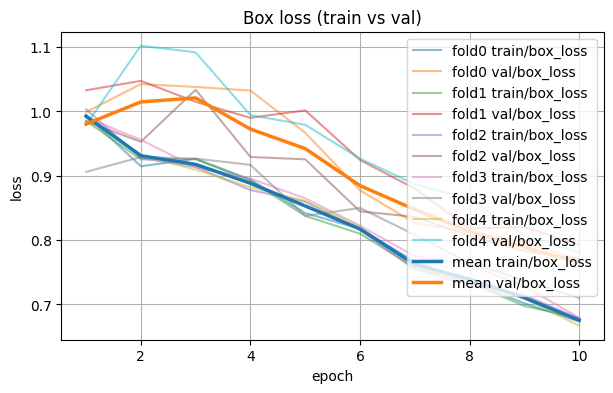

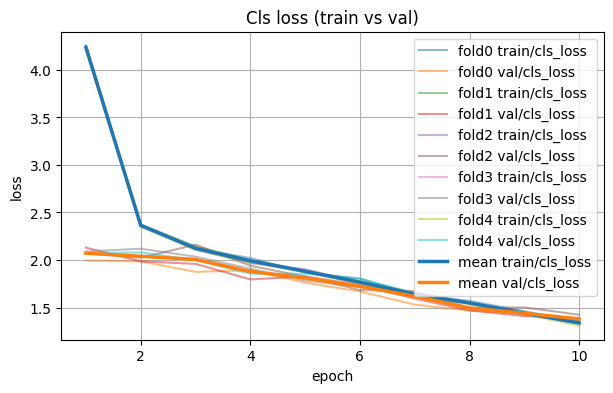

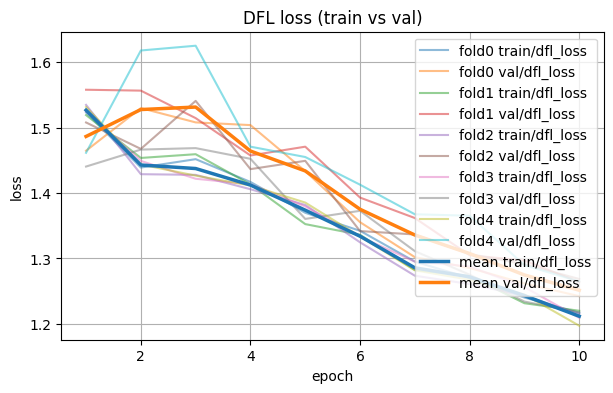

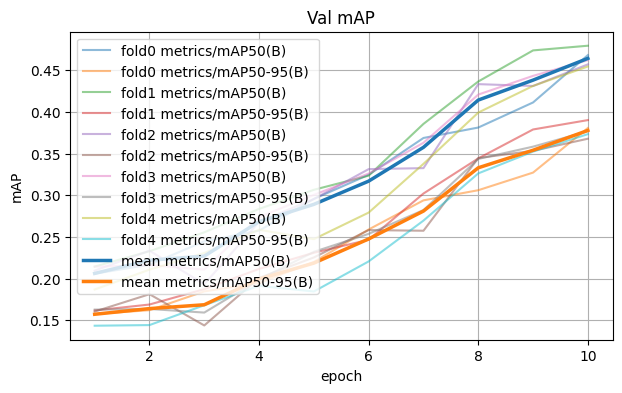

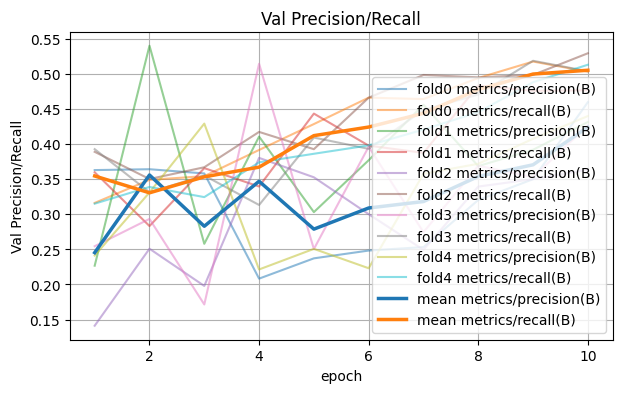

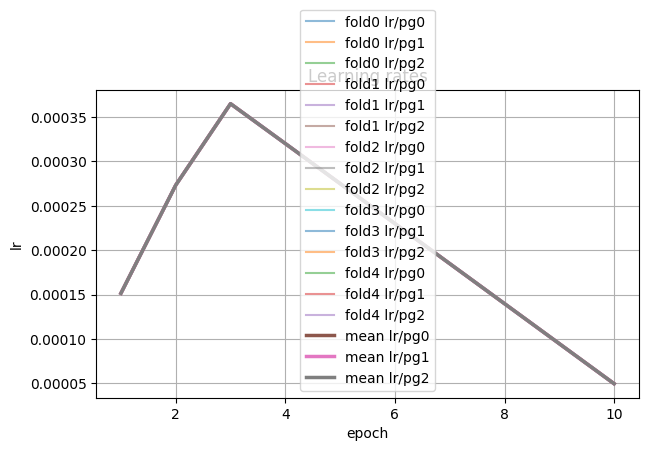

In [18]:
# =========================
# Cell 10 — CV Learning Curves
# =========================
"""
Purpose:
Plot Cell-7-style learning curves (train vs val losses, mAP, precision/recall, LRs)
for a 5-fold cross-validation run produced by Cell 9. The cell:
- Auto-detects the most recent '/content/runs/cv_5fold_*/cv_summary.csv'
- Loads each fold's 'results.csv' via the 'run_dir' column in the summary
- Plots per-fold curves and (optionally) an aggregated mean curve across folds
- Is robust to missing columns; only plots what exists

Args:
CV_SUMMARY_PATH : str | None
    If None, the cell finds the most recent '/content/runs/cv_5fold_*/cv_summary.csv'.
SHOW_PER_FOLD   : bool
    If True, draw each fold's curve (one line per fold).
SHOW_MEAN       : bool
    If True, draw aggregated mean curve across folds (computed per epoch where available).
SHOW_PR_IMAGES  : bool
    If True, display PR/P/R/F1 images if they exist in each fold's run_dir.

Returns:
(No Python return)
- Matplotlib figures for:
  - train/val box_loss
  - train/val cls_loss
  - train/val dfl_loss
  - val mAP50 and mAP50-95
  - val precision and recall
  - learning rates (if present)
- Optionally displays PR_curve.png, P_curve.png, R_curve.png, F1_curve.png from each fold
"""

# ------------------------------
# TOGGLES
# ------------------------------
CV_SUMMARY_PATH = None     # e.g., "/content/runs/cv_5fold_2025....../cv_summary.csv"
SHOW_PER_FOLD   = True
SHOW_MEAN       = True
SHOW_PR_IMAGES  = False     # set True to also display PR/P/R/F1 images from each fold

# ------------------------------
# Imports
# ------------------------------
import os, glob
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image

# ------------------------------
# Locate cv_summary.csv
# ------------------------------
def find_latest_cv_summary():
    candidates = sorted(glob.glob("/content/runs/cv_5fold_*"), key=os.path.getmtime)
    assert candidates, "No '/content/runs/cv_5fold_*' directory found. Run Cell 9 first."
    for cv_dir in reversed(candidates):
        p = Path(cv_dir) / "cv_summary.csv"
        if p.exists():
            return p
    raise FileNotFoundError("Could not find 'cv_summary.csv' in any cv_5fold_* directory.")

summary_path = Path(CV_SUMMARY_PATH) if CV_SUMMARY_PATH else find_latest_cv_summary()
print("Using summary:", summary_path)

# ------------------------------
# Load summary & run_dirs
# ------------------------------
summary_df = pd.read_csv(summary_path)
assert "run_dir" in summary_df.columns, "cv_summary.csv is missing 'run_dir' column."

# Drop MEAN row if present
fold_rows = summary_df[summary_df["fold"].astype(str) != "MEAN"].copy()

# Gather each fold's results.csv
fold_results = {}  # fold -> DataFrame
for _, row in fold_rows.iterrows():
    fold = int(row["fold"])
    run_dir = Path(str(row["run_dir"]))
    csv_path = run_dir / "results.csv"
    if not csv_path.exists():
        # Sometimes Ultralytics nests (e.g., run_dir/..). Try to search one level up.
        alt = list(run_dir.rglob("results.csv"))
        csv_path = alt[0] if alt else csv_path
    if not csv_path.exists():
        print(f"[WARN] Missing results.csv for fold {fold} at {run_dir}")
        continue
    df = pd.read_csv(csv_path)
    fold_results[fold] = df

assert fold_results, "No results.csv files found for any fold."

# Detect epoch column (some runs have it explicit)
def get_epochs(df: pd.DataFrame):
    return df["epoch"] if "epoch" in df.columns else pd.RangeIndex(start=0, stop=len(df), step=1)

# Helper: line plot for multiple folds + optional mean
def plot_curves(columns, title, ylabel=""):
    # Keep only existing columns
    columns = [c for c in columns if any(c in d.columns for d in fold_results.values())]
    if not columns:
        return
    plt.figure(figsize=(7,4))

    # Per-fold
    if SHOW_PER_FOLD:
        for fold, df in sorted(fold_results.items()):
            ep = get_epochs(df)
            for col in columns:
                if col in df.columns:
                    # per-fold lines (lighter alpha)
                    plt.plot(ep, df[col], label=f"fold{fold} {col}", alpha=0.5)

    # Mean across folds
    if SHOW_MEAN:
        # Build mean per epoch per column (only where data exists)
        # Use union of all epochs across folds to be safe
        all_epochs = sorted(set().union(*[set(get_epochs(df).tolist()) for df in fold_results.values()]))
        for col in columns:
            vals = []
            for e in all_epochs:
                per_fold_vals = []
                for df in fold_results.values():
                    ep = get_epochs(df)
                    # Map epoch index to row
                    # If explicit 'epoch' col: match, else use position if in range
                    if "epoch" in df.columns:
                        match = df[df["epoch"] == e]
                        if not match.empty and col in match.columns and pd.notna(match.iloc[0][col]):
                            per_fold_vals.append(float(match.iloc[0][col]))
                    else:
                        if 0 <= e < len(df) and col in df.columns and pd.notna(df.iloc[e][col]):
                            per_fold_vals.append(float(df.iloc[e][col]))
                vals.append(np.mean(per_fold_vals) if per_fold_vals else np.nan)
            # mean curve (thicker line)
            plt.plot(all_epochs, vals, linewidth=2.5, label=f"mean {col}")

    plt.title(title)
    plt.xlabel("epoch")
    plt.ylabel(ylabel or title)
    plt.grid(True)
    plt.legend()
    plt.show()

# ------------------------------
# Plots (same categories as Cell 7)
# ------------------------------
# Losses
plot_curves(["train/box_loss","val/box_loss"], "Box loss (train vs val)", "loss")
plot_curves(["train/cls_loss","val/cls_loss"], "Cls loss (train vs val)", "loss")
plot_curves(["train/dfl_loss","val/dfl_loss"], "DFL loss (train vs val)", "loss")

# Validation metrics
plot_curves(["metrics/mAP50(B)","metrics/mAP50-95(B)"], "Val mAP", "mAP")
plot_curves(["metrics/precision(B)","metrics/recall(B)"], "Val Precision/Recall")

# Learning rates (if present)
plot_curves(["lr/pg0","lr/pg1","lr/pg2"], "Learning rates", "lr")

# ------------------------------
# Optional: show PR/P/R/F1 images saved by Ultralytics for each fold
# ------------------------------
if SHOW_PR_IMAGES:
    for _, row in fold_rows.iterrows():
        fold = int(row["fold"])
        run_dir = Path(str(row["run_dir"]))
        print(f"\nFold {fold} images from:", run_dir)
        for fname in ["PR_curve.png", "P_curve.png", "R_curve.png", "F1_curve.png"]:
            p = run_dir / fname
            if p.exists():
                print(" -", fname)
                display(Image.open(p))


In [22]:
# =========================
# Cell X — Confusion Matrix Only (per fold)
# =========================
"""
Purpose:
Create confusion matrices for each CV fold without retraining. It:
- Auto-discovers the most recent '/content/runs/cv_5fold_*/cv_summary.csv' unless provided
- Loads each fold's best weights and dataset YAML
- Runs validation once per fold with plots=True to write confusion_matrix.png
- Exports raw and row-normalized confusion matrices as CSV

Args:
CV_SUMMARY_PATH : str | None
    If None, finds the newest '/content/runs/cv_5fold_*/cv_summary.csv'.
FOLD_IDS        : list[int] | None
    If given, restrict to these fold indices, e.g. [0, 2]. If None, process all folds.
CONF_EVAL       : float
IOU_EVAL        : float
BATCH           : int
DEVICE          : str
SAVE_CSV        : bool
PLOTS           : bool

Outputs (per fold):
<CV_ROOT>/fold_{k}/val/confusion_matrix.png
<CV_ROOT>/fold_{k}/val/confusion_matrix.csv
<CV_ROOT>/fold_{k}/val/confusion_matrix_normalized.csv
"""

from pathlib import Path
import glob, os
import pandas as pd
import numpy as np

try:
    from ultralytics import YOLO
except Exception as e:
    raise ImportError("Please install Ultralytics to run confusion matrix export: pip install -U ultralytics") from e

# ----------------------------
# Config
# ----------------------------
CV_SUMMARY_PATH = None    # or set explicit path like "/content/runs/cv_5fold_20250819_104512/cv_summary.csv"
FOLD_IDS        = None    # e.g. [0, 1]; set None to run all folds found
CONF_EVAL       = 0.25
IOU_EVAL        = 0.50
BATCH           = 4
DEVICE          = "cuda:0" if (hasattr(__import__("torch"), "cuda") and __import__("torch").cuda.is_available()) else "cpu"
SAVE_CSV        = True
PLOTS           = True

# ----------------------------
# Helpers
# ----------------------------
def _find_latest_cv_summary():
    cands = sorted(glob.glob("/content/runs/cv_5fold_*/cv_summary.csv"))
    if not cands:
        raise FileNotFoundError("Could not find any '/content/runs/cv_5fold_*/cv_summary.csv'. Train CV first.")
    return cands[-1]

def _safe_read_df(p: Path) -> pd.DataFrame:
    if not p.is_file():
        raise FileNotFoundError(f"cv_summary.csv missing at: {p}")
    df = pd.read_csv(p)
    if "fold" not in df.columns or "run_dir" not in df.columns:
        raise ValueError("cv_summary.csv must contain 'fold' and 'run_dir' columns.")
    return df

def _val_and_save_cm(weights_path: Path, data_yaml: Path, out_dir: Path,
                     iou: float, conf: float, batch: int, device: str,
                     save_csv: bool, do_plots: bool):
    model = YOLO(str(weights_path))
    out_dir.mkdir(parents=True, exist_ok=True)

    metrics = model.val(
        data=str(data_yaml),
        split="val",
        imgsz=640,
        batch=batch,
        device=device,
        iou=iou,
        conf=conf,
        plots=do_plots,
        project=str(out_dir.parent),  # parent = fold_{k}
        name=out_dir.name,            # "val"
        exist_ok=True
    )

    # Export raw and row-normalized CSVs
    if save_csv:
        try:
            cm_df_orig = metrics.confusion_matrix.to_df()
        except Exception as e:
            raise RuntimeError("Ultralytics did not return a confusion_matrix DataFrame. "
                               "Make sure your version supports 'metrics.confusion_matrix.to_df()'.") from e

        # FIX: Coerce to numeric to handle cases where the DataFrame has non-numeric values
        cm_df = cm_df_orig.apply(pd.to_numeric, errors='coerce').fillna(0).astype(int)

        raw_csv = out_dir / "confusion_matrix.csv"
        cm_df.to_csv(raw_csv, index=True)

        with np.errstate(invalid="ignore", divide="ignore"):
            row_sums = cm_df.sum(axis=1).replace(0, np.nan)
            cm_norm = cm_df.div(row_sums, axis=0)
        norm_csv = out_dir / "confusion_matrix_normalized.csv"
        cm_norm.to_csv(norm_csv, index=True)

    png_hint = out_dir / "confusion_matrix.png"  # Ultralytics writes here with plots=True
    print(f"[OK] Saved confusion matrix for fold at: {out_dir}")
    if png_hint.exists():
        print(f" - PNG : {png_hint}")
    if save_csv:
        print(f" - CSV : {out_dir/'confusion_matrix.csv'}")
        print(f" - CSVn: {out_dir/'confusion_matrix_normalized.csv'}")

# ----------------------------
# Discover summary and iterate folds
# ----------------------------
if CV_SUMMARY_PATH is None:
    CV_SUMMARY_PATH = _find_latest_cv_summary()
cv_summary = Path(CV_SUMMARY_PATH).resolve()
cv_root = cv_summary.parent
print(f"[INFO] Using CV summary: {cv_summary}")
print(f"[INFO] CV root        : {cv_root}")

df = _safe_read_df(cv_summary)

# Keep only numeric fold rows
df_clean = df[df["fold"].apply(lambda x: str(x).isdigit())].copy()
df_clean["fold"] = df_clean["fold"].astype(int)

if FOLD_IDS is not None:
    df_clean = df_clean[df_clean["fold"].isin(FOLD_IDS)]
    if df_clean.empty:
        raise ValueError(f"No matching folds for FOLD_IDS={FOLD_IDS} in {cv_summary}")

for _, row in df_clean.sort_values("fold").iterrows():
    k = int(row["fold"])
    run_dir = Path(row["run_dir"]).resolve()
    weights_dir = run_dir / "weights"
    weights = weights_dir / "best.pt"
    if not weights.exists():
        weights = weights_dir / "last.pt"
    if not weights.exists():
        raise FileNotFoundError(f"No weights found for fold {k} at {weights_dir}")

    # Dataset YAML written during CV at: <cv_root>/fold_{k}/dataset/data.yaml
    data_yaml = cv_root / f"fold_{k}" / "dataset" / "data.yaml"
    if not data_yaml.is_file():
        raise FileNotFoundError(f"data.yaml missing for fold {k}: {data_yaml}")

    out_dir = cv_root / f"fold_{k}" / "val"   # will contain confusion_matrix assets
    print(f"\n[RUN] Fold {k}:")
    print(f" - weights : {weights}")
    print(f" - data    : {data_yaml}")
    print(f" - out_dir : {out_dir}")

    _val_and_save_cm(
        weights_path=weights,
        data_yaml=data_yaml,
        out_dir=out_dir,
        iou=IOU_EVAL,
        conf=CONF_EVAL,
        batch=BATCH,
        device=DEVICE,
        save_csv=SAVE_CSV,
        do_plots=PLOTS
    )

print("\nDone. Open each fold folder for PNG and CSV files.")


[INFO] Using CV summary: /content/runs/cv_5fold_20250820_003107/cv_summary.csv
[INFO] CV root        : /content/runs/cv_5fold_20250820_003107

[RUN] Fold 0:
 - weights : /content/runs/detect/cv_fold0/weights/best.pt
 - data    : /content/runs/cv_5fold_20250820_003107/fold_0/dataset/data.yaml
 - out_dir : /content/runs/cv_5fold_20250820_003107/fold_0/val
Ultralytics 8.3.181 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22574MiB)
YOLO11s summary (fused): 100 layers, 9,419,766 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 28.2±14.0 MB/s, size: 20.1 KB)


val: Scanning /content/runs/cv_5fold_20250820_003107/fold_0/dataset/labels/val.cache... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:07<00:00, 22.43it/s]


                   all        625        625      0.452      0.453      0.453      0.384
  Clear plastic bottle         54         54      0.672      0.796      0.735       0.66
          Glass bottle         21         21      0.385      0.238      0.315      0.252
    Plastic bottle cap         32         32        0.6      0.656      0.556      0.473
      Metal bottle cap         14         14      0.286      0.286      0.274      0.251
          Broken glass         24         24      0.444        0.5      0.459       0.31
             Drink can         43         43      0.592      0.674      0.665      0.605
          Other carton         15         15      0.333     0.0667      0.189      0.189
     Corrugated carton          9          9      0.111      0.333      0.309      0.255
             Paper cup         15         15          0          0          0          0
Disposable plastic cup         21         21          1      0.143      0.571      0.571
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_1/dataset/labels/val.cache... 625 images, 0 backgrounds, 0 corrupt: 100%|██████████| 625/625 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:07<00:00, 21.20it/s]


                   all        625        625      0.448      0.465      0.467      0.397
  Clear plastic bottle         41         41      0.643      0.707      0.782      0.725
          Glass bottle         23         23      0.651      0.391      0.543      0.469
    Plastic bottle cap         36         36      0.453       0.75      0.595      0.469
      Metal bottle cap         14         14      0.511      0.357      0.467      0.428
          Broken glass         23         23      0.455       0.69      0.621      0.355
             Drink can         39         39      0.497      0.615      0.594      0.551
          Other carton         20         20      0.196        0.1      0.135      0.131
     Corrugated carton         18         18      0.415      0.722      0.703      0.617
             Paper cup         13         13      0.144     0.0769      0.134      0.134
Disposable plastic cup         11         11      0.603      0.182      0.347      0.326
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_2/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:06<00:00, 22.62it/s]


                   all        624        624      0.453       0.46       0.45      0.379
  Clear plastic bottle         54         54      0.829      0.537      0.712      0.648
          Glass bottle         17         17      0.643      0.529      0.644      0.562
    Plastic bottle cap         28         28      0.415      0.607      0.502      0.388
      Metal bottle cap         17         17       0.75      0.176      0.485      0.431
          Broken glass         26         26      0.484      0.577      0.428      0.234
             Drink can         30         30        0.5        0.8      0.763      0.737
          Other carton         17         17      0.143     0.0588     0.0861     0.0603
     Corrugated carton         12         12      0.211      0.667      0.319      0.288
             Paper cup         13         13        0.4      0.154      0.246      0.246
Disposable plastic cup         26         26        0.5      0.154      0.288      0.281
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_3/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:06<00:00, 23.09it/s]


                   all        624        624      0.396      0.491      0.435       0.36
  Clear plastic bottle         62         62      0.634      0.726       0.71       0.68
          Glass bottle         15         15      0.583      0.467      0.482      0.414
    Plastic bottle cap         39         39      0.375      0.769      0.434      0.377
      Metal bottle cap         12         12       0.19      0.333      0.223      0.175
          Broken glass         23         23      0.455       0.87      0.788      0.502
             Drink can         43         43      0.585      0.558      0.631      0.586
          Other carton         19         19          0          0          0          0
     Corrugated carton         10         10      0.533        0.8      0.624      0.538
             Paper cup         12         12          0          0          0          0
Disposable plastic cup         23         23          0          0          0          0
           Plastic li

val: Scanning /content/runs/cv_5fold_20250820_003107/fold_4/dataset/labels/val.cache... 624 images, 0 backgrounds, 0 corrupt: 100%|██████████| 624/624 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 156/156 [00:06<00:00, 22.87it/s]


                   all        624        624      0.449      0.505      0.461      0.393
  Clear plastic bottle         46         46      0.846      0.717      0.795      0.751
          Glass bottle         13         13      0.538      0.538      0.533      0.482
    Plastic bottle cap         46         46      0.411        0.5      0.364      0.307
      Metal bottle cap         13         13       0.21      0.385      0.273      0.242
          Broken glass         25         25      0.513      0.716      0.643      0.384
             Drink can         45         45      0.711      0.711      0.774      0.721
          Other carton         13         13      0.429      0.231      0.301      0.293
     Corrugated carton         10         10      0.268        0.8      0.567      0.498
             Paper cup         10         10      0.118        0.2      0.115      0.115
Disposable plastic cup         17         17      0.429      0.176      0.308      0.285
           Plastic li

**CV root:** `/content/runs/cv_5fold_20250820_003107`

### Fold 0

Raw

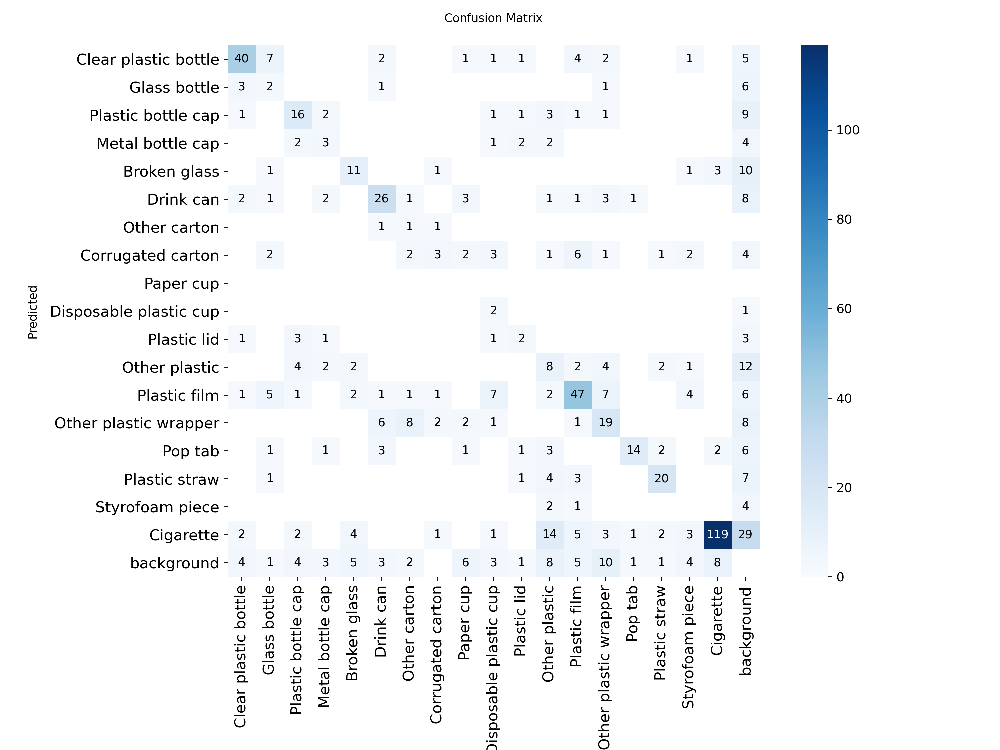

Row-normalized

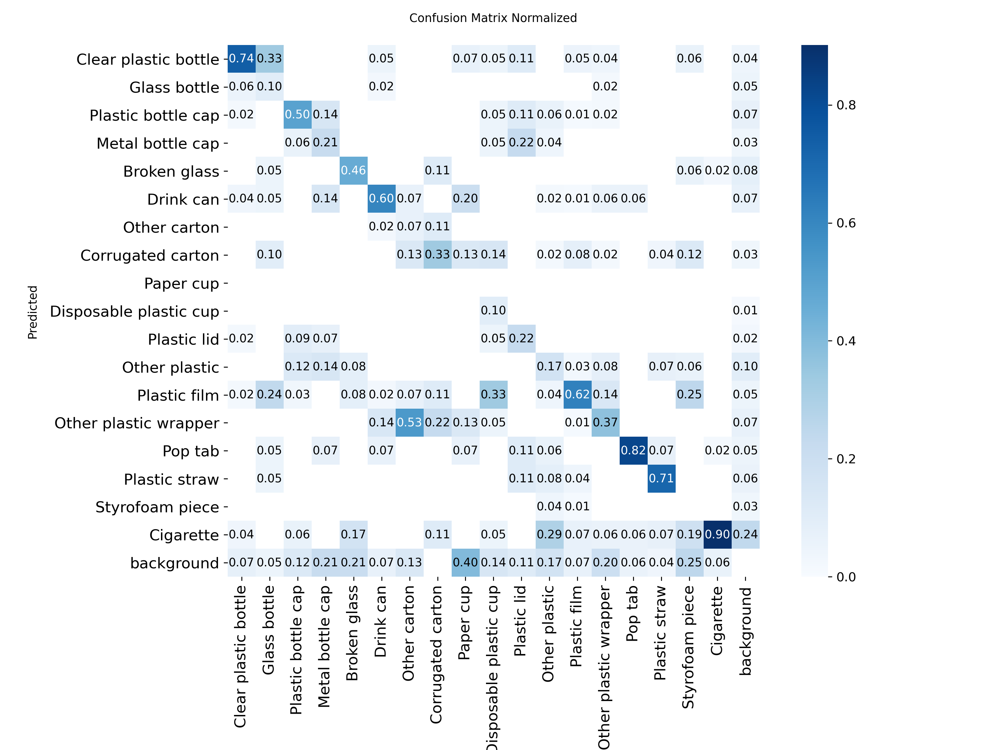

### Fold 1

Raw

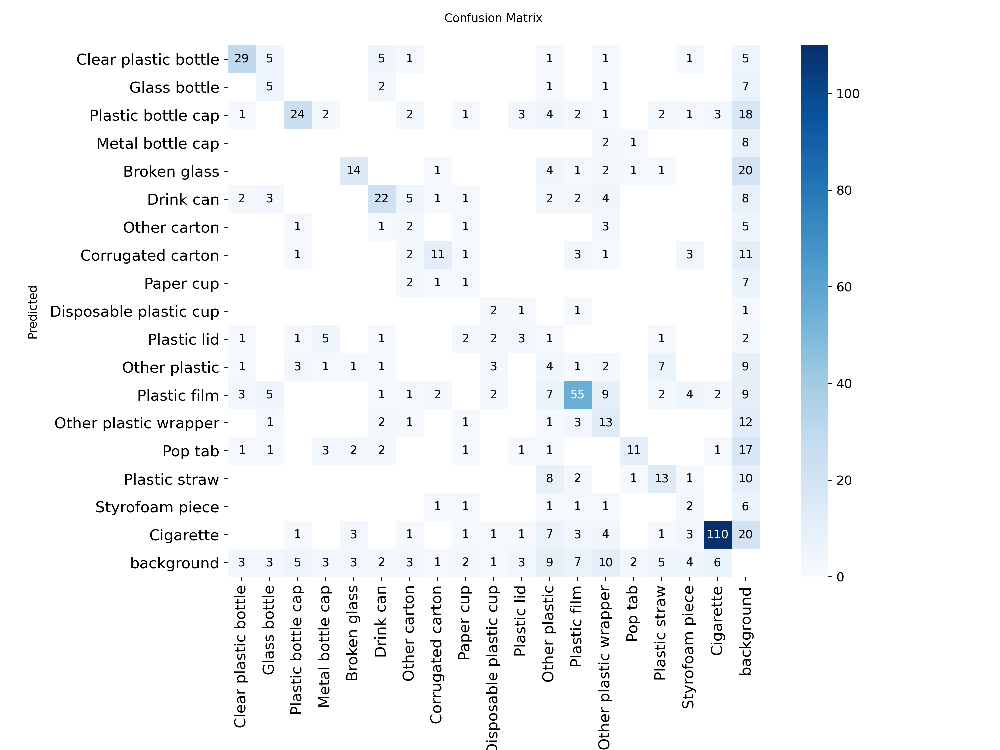

Row-normalized

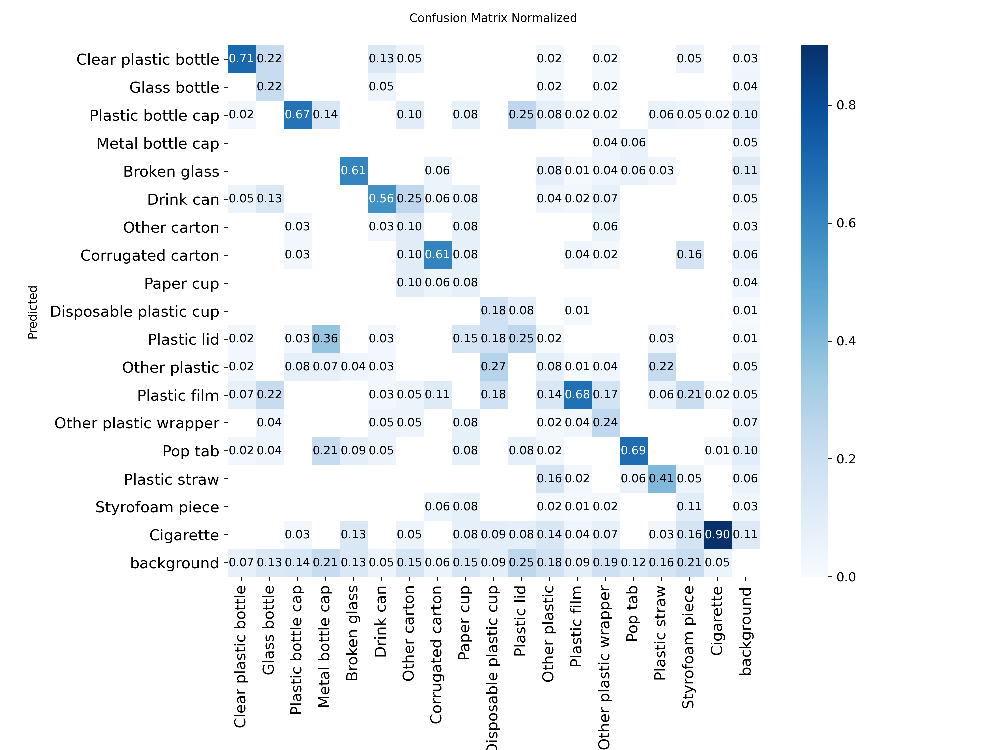

### Fold 2

Raw

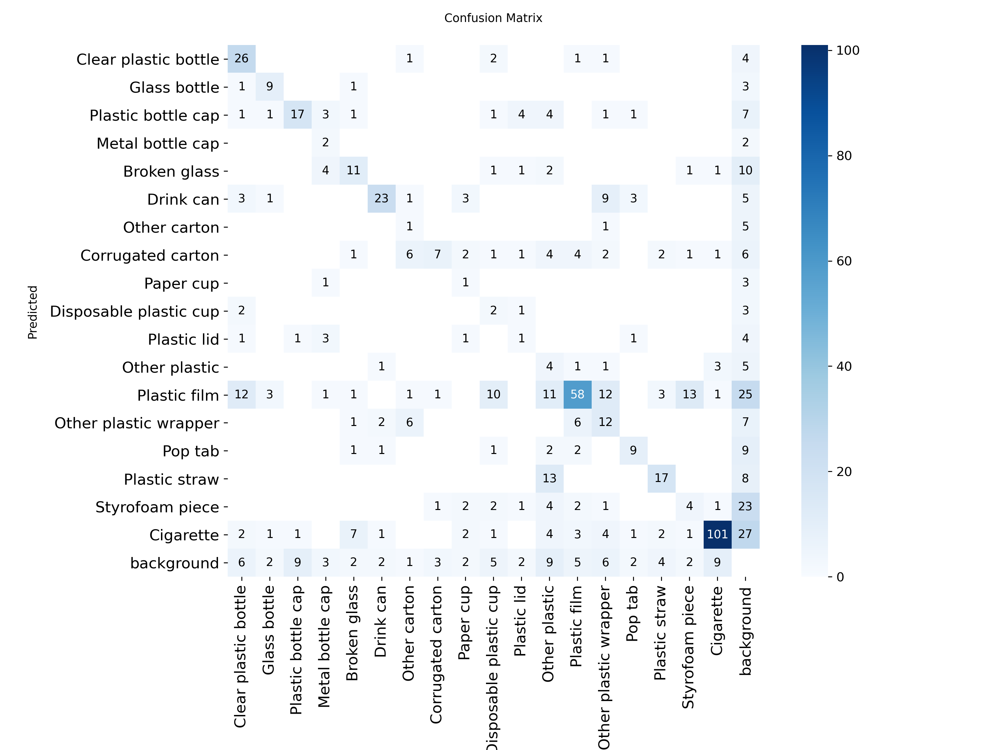

Row-normalized

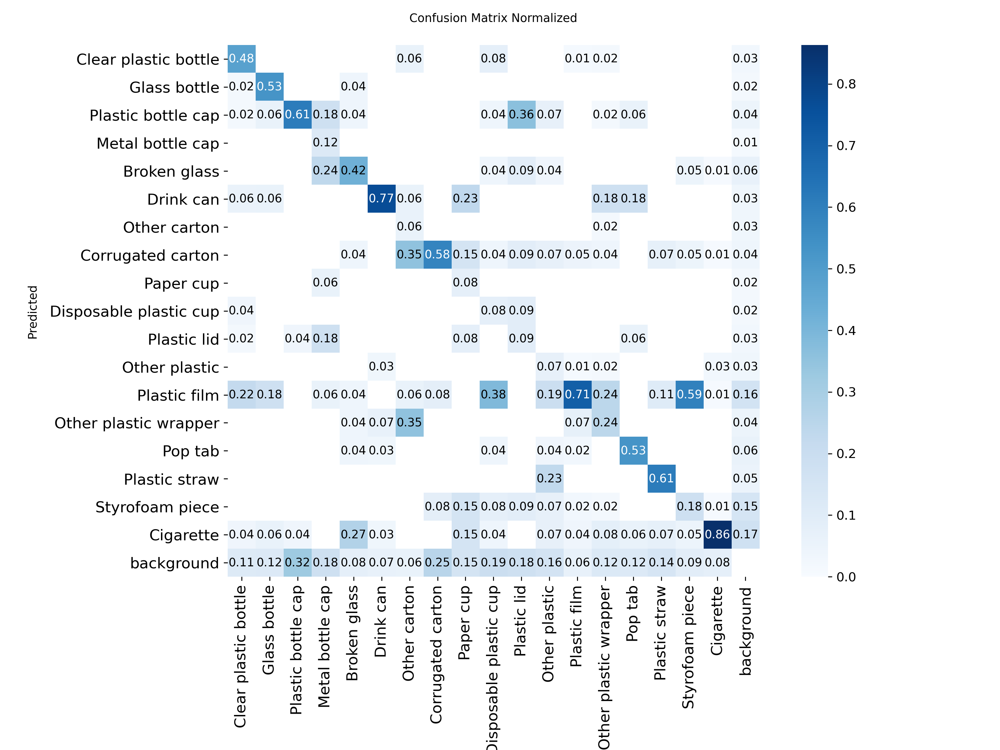

### Fold 3

Raw

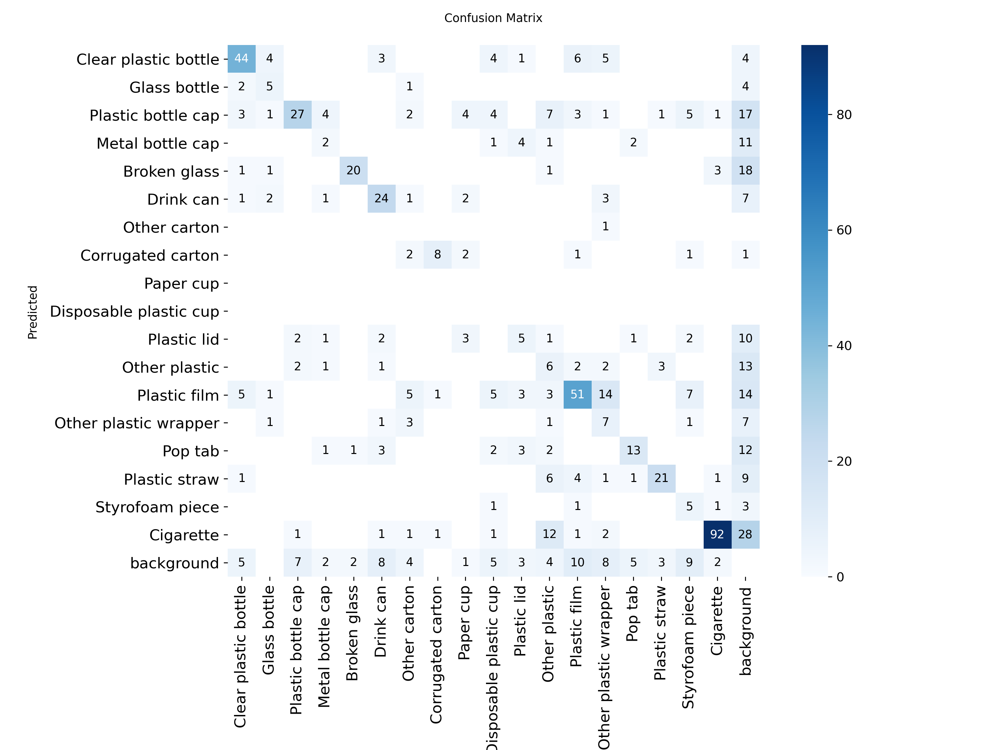

Row-normalized

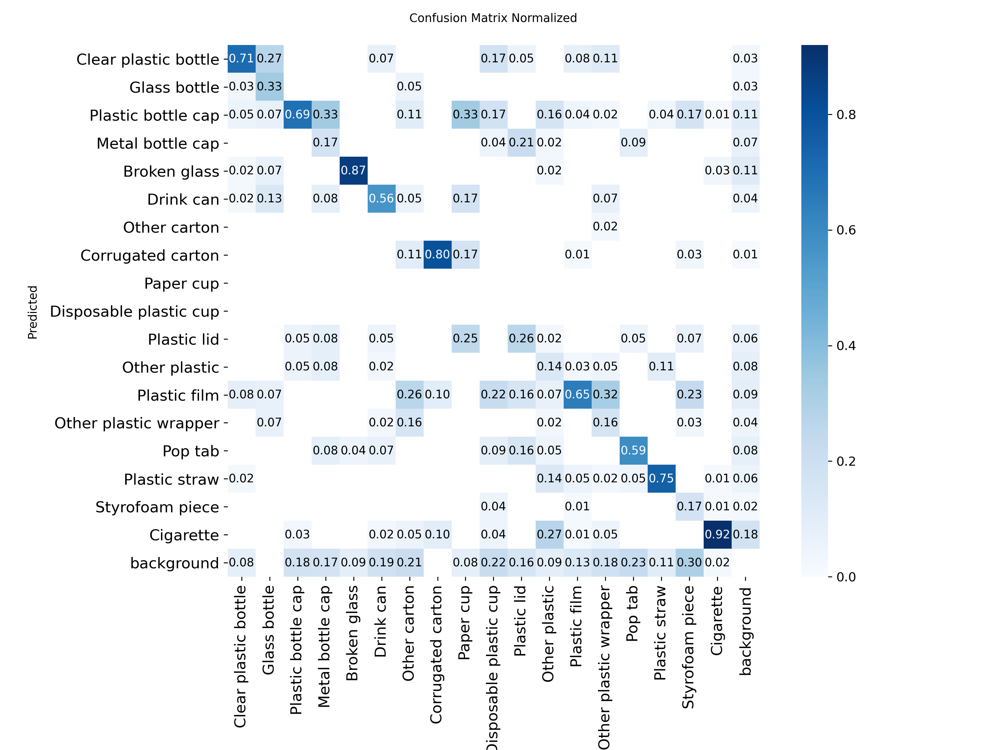

### Fold 4

Raw

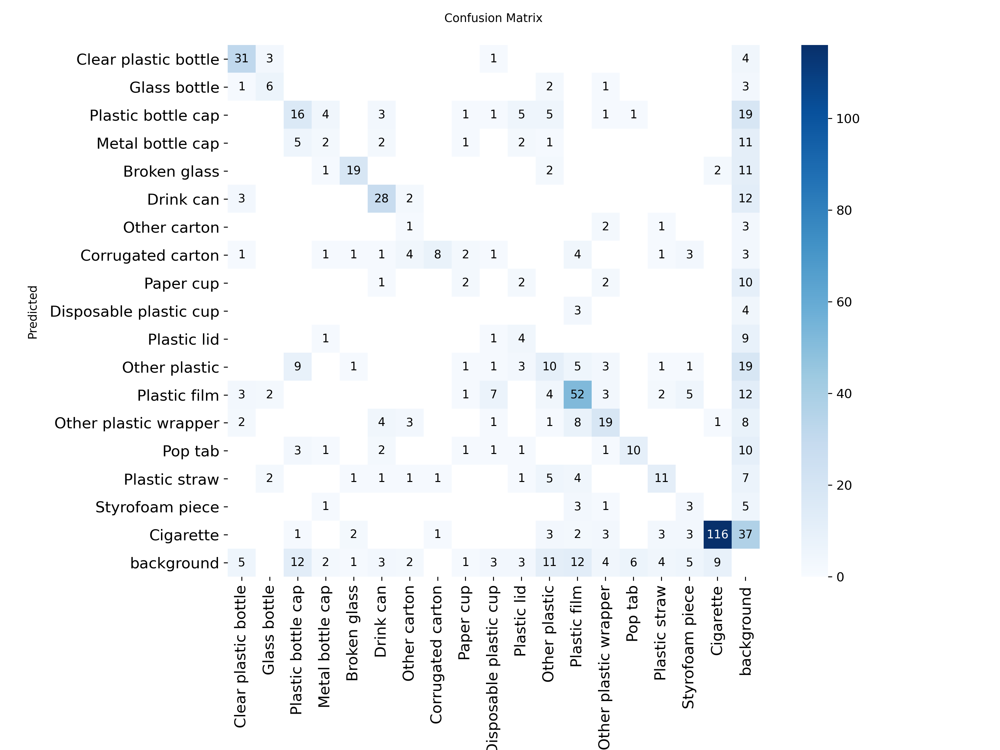

Row-normalized

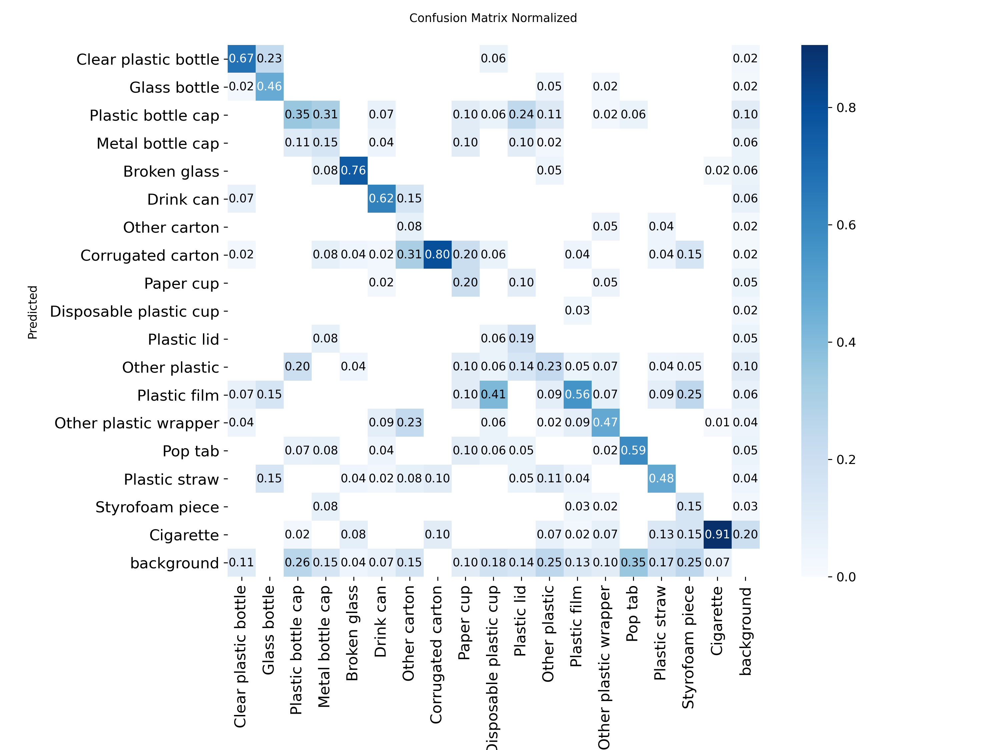

In [23]:
# =========================
# Cell — View Confusion Matrix Plots (per fold)
# =========================
from pathlib import Path
import glob
import pandas as pd
from IPython.display import display, Image, Markdown

# Optional: set explicitly if you want a specific run
CV_SUMMARY_PATH = None   # e.g. "/content/runs/cv_5fold_20250820_003107/cv_summary.csv"
FOLD_IDS        = None   # e.g. [0, 2] to view only some folds

def _find_latest_cv_root():
    cands = sorted(glob.glob("/content/runs/cv_5fold_*"))
    if not cands:
        raise FileNotFoundError("No cv_5fold_* runs found under /content/runs.")
    return Path(cands[-1])

def _load_cv_df(cv_summary_path):
    if cv_summary_path is None:
        cv_root = _find_latest_cv_root()
        csv_path = cv_root / "cv_summary.csv"
    else:
        csv_path = Path(cv_summary_path)
        cv_root = csv_path.parent
    if not csv_path.is_file():
        raise FileNotFoundError(f"cv_summary.csv not found at {csv_path}")
    df = pd.read_csv(csv_path)
    df = df[df["fold"].apply(lambda x: str(x).isdigit())].copy()
    df["fold"] = df["fold"].astype(int)
    return cv_root, df

cv_root, df = _load_cv_df(CV_SUMMARY_PATH)
if FOLD_IDS is not None:
    df = df[df["fold"].isin(FOLD_IDS)]
display(Markdown(f"**CV root:** `{cv_root}`"))

for k in sorted(df["fold"].unique()):
    val_dir = cv_root / f"fold_{k}" / "val"
    png_raw  = val_dir / "confusion_matrix.png"
    png_norm = val_dir / "confusion_matrix_normalized.png"

    display(Markdown(f"### Fold {k}"))

    shown_any = False
    if png_raw.exists():
        display(Markdown("Raw"))
        display(Image(filename=str(png_raw), width=900))
        shown_any = True
    if png_norm.exists():
        display(Markdown("Row-normalized"))
        display(Image(filename=str(png_norm), width=900))
        shown_any = True

    # Fallback: draw from CSV if PNGs do not exist
    if not shown_any:
        csv_path = val_dir / "confusion_matrix.csv"
        if csv_path.exists():
            import matplotlib.pyplot as plt
            import numpy as np
            cm = pd.read_csv(csv_path, index_col=0)
            fig = plt.figure(figsize=(8, 6))
            plt.imshow(cm.values, interpolation="nearest")
            plt.title(f"Fold {k} confusion matrix")
            plt.xlabel("Predicted")
            plt.ylabel("True")
            plt.colorbar()
            plt.tight_layout()
            plt.show()
        else:
            display(Markdown("_No PNG or CSV found for this fold. Run the confusion-matrix export cell first._"))
